In [1]:
import trimesh
import numpy as np
import numpy
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

from trimesh.visual.color import ColorVisuals
from trimesh.path import Path3D
from trimesh.path import Path2D

In [2]:
with open('PolyCat/PolyCat.gcode','r') as f:
    gcode = f.read()
    f.close()

In [3]:
gcode = gcode.split('\n')

In [4]:
def point_from_gcode(line):
    x=None
    y=None
    # get x value
    for c in line[3:].split(' '):
        if(c[0]=='X'):
            x=float(c[1:])
    # get y value
    for c in line[3:].split(' '):
        if(c[0]=='Y'):
            y=float(c[1:])
    return (x,y)

layer_zs=[0]
last_x=None
last_y=None
layer_changes=False
get_permiters=False
points = {}
get_perimeter_types = [
    "External perimeter",
    "Overhang perimeter",
    "Perimeter",
    "Solid infill"
]

print("Loading G-Code...")
for line in gcode:
    #print(line)
    if(line[0:13]==";LAYER_CHANGE"):
        #print("Layer change")
        layer_changes=True
    elif layer_changes and line[0:3]==";Z:":
        z=float(line[3:])
        points[z]=[]
        layer_zs.append(z)
        #print("New Z:",z)
    elif line[0:5]==";TYPE":
        if line[6:] in get_perimeter_types:
            get_permiters=True
        else:
            get_permiters=False
    elif get_permiters and line[0:3]=="G1 ":
        p = point_from_gcode(line)
        if p[0]:
            last_x=p[0]
        if p[1]:
            last_y=p[1]
        if last_x and last_y:
            #print("Placing point", [last_x, last_y, z])
            points[z].append([last_x, last_y, z])
print("DONE")

Loading G-Code...
DONE


In [5]:
scene = trimesh.Scene()

In [6]:
glbCat = trimesh.load('PolyCat/PolyCat.glb', force='mesh', merge_tex=True)

In [7]:
glbCat.apply_transform(trimesh.transformations.rotation_matrix(np.radians(90), [1,0,0]))

<trimesh.Trimesh(vertices.shape=(24956, 3), faces.shape=(42732, 3))>

In [8]:
mpoints=[]
for z in points:
   mpoints+=points[z] 
v = np.array(mpoints)
catPointCloud = trimesh.points.PointCloud(v, colors=np.tile(np.array([0, 0, 0, 1]), (len(v), 1)))

In [9]:
scene.add_geometry(catPointCloud)

'geometry_0'

In [10]:
trimesh.transformations.scale_matrix(0.5)
bbPC=catPointCloud.bounds[1]-catPointCloud.bounds[0]
bbGLB=glbCat.bounds[1]-glbCat.bounds[0]
Sx=bbPC[0]/bbGLB[0]
Sy=bbPC[1]/bbGLB[1]
Sz=bbPC[2]/bbGLB[2]
S=np.array([
    [Sx, 0., 0., 0.],
    [0., Sy, 0., 0.],
    [0., 0., Sz, 0.],
    [0., 0., 0., 1.]
])
glbCat.apply_transform(S)

<trimesh.Trimesh(vertices.shape=(24956, 3), faces.shape=(42732, 3))>

In [11]:
# Slicing GBL cat
orig_p=glbCat.center_mass
orig_p[2]=layer_zs[0]
layers = glbCat.section_multiplane(
    plane_origin=glbCat.center_mass,
    plane_normal=[0, 0, 1],
    heights=np.array(layer_zs)
)

In [12]:
new_layer_slices=[]
layer_slices=[]

In [13]:
# Aligning GBL cat with slices
for id, section_2d in enumerate(layers):
    if(section_2d):
        s = section_2d.copy()
        for p in s.polygons_full:
            vertices, faces = trimesh.creation.triangulate_polygon(p)
            m = trimesh.creation.extrude_triangulation(
                vertices=vertices,
                faces=faces,
                height=layer_zs[id+1]-layer_zs[id]
            )
            m.apply_translation([0,0,layer_zs[id]])
            new_layer_slices.append(m)

layer_slices = new_layer_slices

sliced_cat_scene = trimesh.Scene()
sliced_cat_scene.add_geometry(layer_slices)

transform=sliced_cat_scene.bounds[0]-glbCat.bounds[0]
m=glbCat.apply_translation(transform)

sliced_cat_scene.show()

In [14]:
'''
# Aligning GBL cat with slices
ms=[]
for id, section_2d in enumerate(layers):
    if(section_2d):
        s = section_2d.copy()
        for p in s.polygons_full:
            vertices, faces = trimesh.creation.triangulate_polygon(p)
            m = trimesh.creation.extrude_triangulation(
                vertices=vertices,
                faces=faces,
                height=layer_zs[id+1]-layer_zs[id]
            )
            ms.append(m)
        es = s.extrude(layer_zs[id+1]-layer_zs[id])
        if(type(es)==list):
            for e in es:
                e.apply_translation([0,0,layer_zs[id]])
                new_layer_slices.append(e)
                sliced_cat_scene.add_geometry(e)
        else:
            es.apply_translation([0,0,layer_zs[id]])
            new_layer_slices.append(es)

transform=sliced_cat_scene.bounds[0]-glbCat.bounds[0]
m=glbCat.apply_translation(transform)
layer_slices = new_layer_slices

sliced_cat_scene = trimesh.Scene()
sliced_cat_scene.add_geometry(ms)
#sliced_cat_scene.add_geometry(layer_slices)
sliced_cat_scene.show()
'''

'\n# Aligning GBL cat with slices\nms=[]\nfor id, section_2d in enumerate(layers):\n    if(section_2d):\n        s = section_2d.copy()\n        for p in s.polygons_full:\n            vertices, faces = trimesh.creation.triangulate_polygon(p)\n            m = trimesh.creation.extrude_triangulation(\n                vertices=vertices,\n                faces=faces,\n                height=layer_zs[id+1]-layer_zs[id]\n            )\n            ms.append(m)\n        es = s.extrude(layer_zs[id+1]-layer_zs[id])\n        if(type(es)==list):\n            for e in es:\n                e.apply_translation([0,0,layer_zs[id]])\n                new_layer_slices.append(e)\n                sliced_cat_scene.add_geometry(e)\n        else:\n            es.apply_translation([0,0,layer_zs[id]])\n            new_layer_slices.append(es)\n\ntransform=sliced_cat_scene.bounds[0]-glbCat.bounds[0]\nm=glbCat.apply_translation(transform)\nlayer_slices = new_layer_slices\n\nsliced_cat_scene = trimesh.Scene()\nsliced

In [15]:
'''
Sx = 0.1
Sy = 0.1
Sz = 1
S=np.array([
    [Sx, 0., 0., 0.],
    [0., Sy, 0., 0.],
    [0., 0., Sz, 0.],
    [0., 0., 0., 1.]
])

new_layer_slices=[]

for slice in layer_slices:
    oslice = slice.copy()
    slice1 = oslice.copy()
    slice2 = oslice.copy()
    slice2 = slice2.apply_transform(S)
    dz=slice1.bounds[0][2]-slice2.bounds[0][2]
    slice2.apply_translation([0,0,dz])
    nslice = trimesh.boolean.difference([slice1,slice2])
    new_layer_slices.append(nslice)
    
layer_slices = new_layer_slices
'''

'\nSx = 0.1\nSy = 0.1\nSz = 1\nS=np.array([\n    [Sx, 0., 0., 0.],\n    [0., Sy, 0., 0.],\n    [0., 0., Sz, 0.],\n    [0., 0., 0., 1.]\n])\n\nnew_layer_slices=[]\n\nfor slice in layer_slices:\n    oslice = slice.copy()\n    slice1 = oslice.copy()\n    slice2 = oslice.copy()\n    slice2 = slice2.apply_transform(S)\n    dz=slice1.bounds[0][2]-slice2.bounds[0][2]\n    slice2.apply_translation([0,0,dz])\n    nslice = trimesh.boolean.difference([slice1,slice2])\n    new_layer_slices.append(nslice)\n\nlayer_slices = new_layer_slices\n'

In [16]:
'''
new_layer_slices=[]
# Applying colors to slices
sliced_cat_scene = trimesh.Scene()
for e in layer_slices:
    #new_v, new_f = trimesh.remesh.subdivide_loop(
    #    e.vertices,
    #    e.faces,
    #    iterations=2
    #)
    #e = trimesh.Trimesh(vertices=new_v, faces=new_f)
    new_v, new_f = trimesh.remesh.subdivide_to_size(
        e.vertices,
        e.faces,
        1.0
    )
    e = trimesh.Trimesh(vertices=new_v, faces=new_f)
    new_layer_slices.append(e)
layer_slices = new_layer_slices
'''

'\nnew_layer_slices=[]\n# Applying colors to slices\nsliced_cat_scene = trimesh.Scene()\nfor e in layer_slices:\n    #new_v, new_f = trimesh.remesh.subdivide_loop(\n    #    e.vertices,\n    #    e.faces,\n    #    iterations=2\n    #)\n    #e = trimesh.Trimesh(vertices=new_v, faces=new_f)\n    new_v, new_f = trimesh.remesh.subdivide_to_size(\n        e.vertices,\n        e.faces,\n        1.0\n    )\n    e = trimesh.Trimesh(vertices=new_v, faces=new_f)\n    new_layer_slices.append(e)\nlayer_slices = new_layer_slices\n'

In [17]:
new_layer_slices=[]
# Applying colors to slices
for e in layer_slices:
    v_idx = glbCat.kdtree.query(np.array(e.vertices))[1]
    uv = glbCat.visual.uv[v_idx]
    color = glbCat.visual.material.to_color(uv)
    e.visual = ColorVisuals(vertex_colors=color.copy())
    new_layer_slices.append(e)
layer_slices = new_layer_slices

sliced_cat_scene = trimesh.Scene()
sliced_cat_scene.add_geometry(layer_slices)
sliced_cat_scene.show()

In [18]:
sliced_transform=catPointCloud.bounds[0]-sliced_cat_scene.bounds[0]
sliced_cat_scene.apply_translation(sliced_transform)
#scene.add_geometry(sliced_cat_scene)

<trimesh.Scene(len(geometry)=143)>

In [19]:
scene.show()

In [20]:
def get_extrusion_top(e):
    ret=[]
    for i, v in enumerate(e.vertices):
        if(v[2]==e.bounds[1][2]):
            ret.append(i)
    return ret

def plt_color(vertex_color):
    color = (
        vertex_color[0]/255,
        vertex_color[1]/255,
        vertex_color[2]/255,
        vertex_color[3]/255
    )
    return color

#sliced_cat_scene = trimesh.Scene()
#for e in layer_slices:
#    sliced_cat_scene.add_geometry(e)
#sliced_transform=catPointCloud.bounds[0]-sliced_cat_scene.bounds[0]

#transform=catPointCloud.bounds[0]-glbCat.bounds[0]
#m=glbCat.apply_translation(transform)

#scene.add_geometry(glbCat)
#scene.show()

Layer 0.0


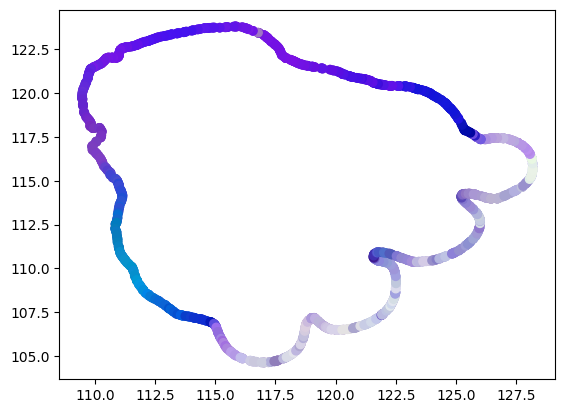

Layer 0.3


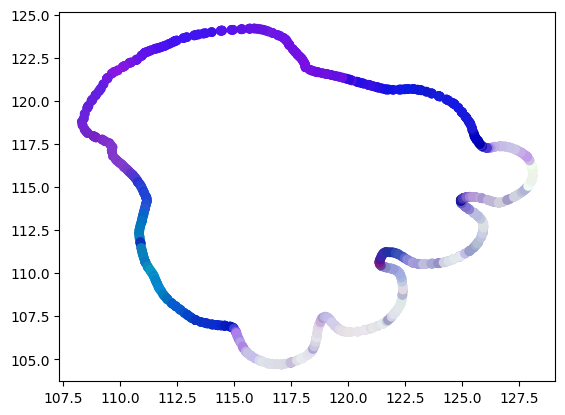

Layer 0.55


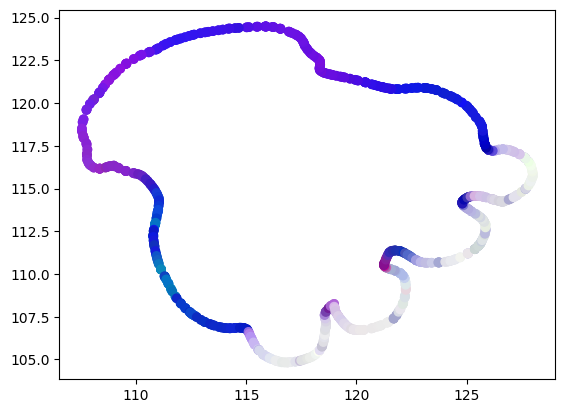

Layer 0.8


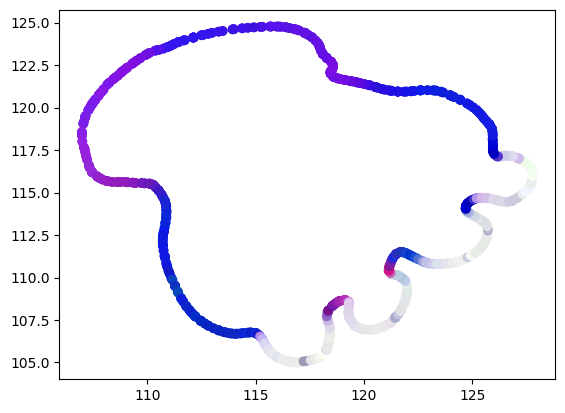

Layer 1.05


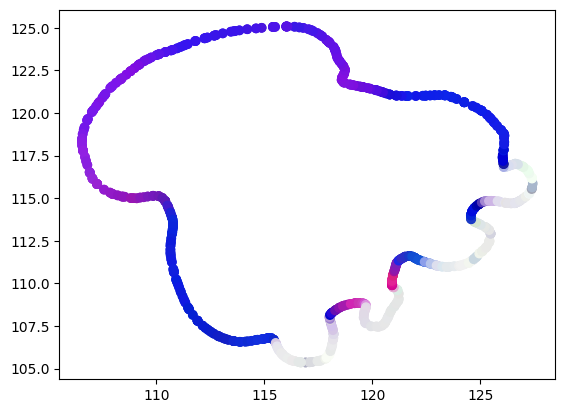

Layer 1.3


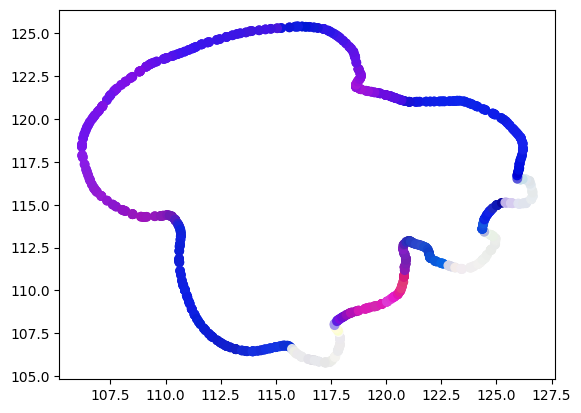

Layer 1.55


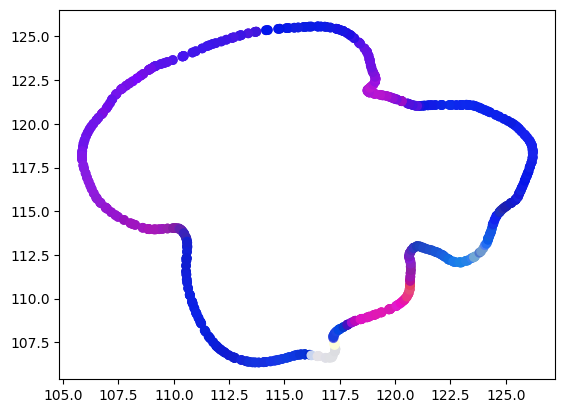

Layer 1.8


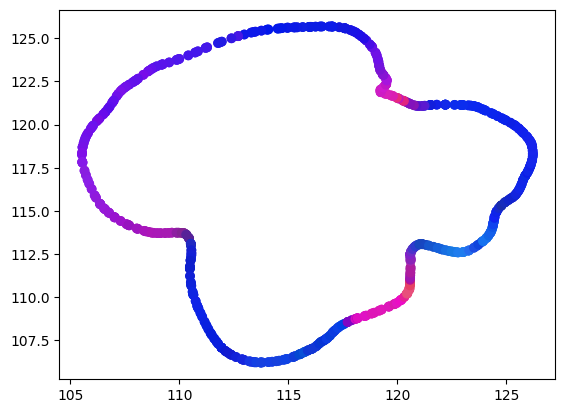

Layer 2.05


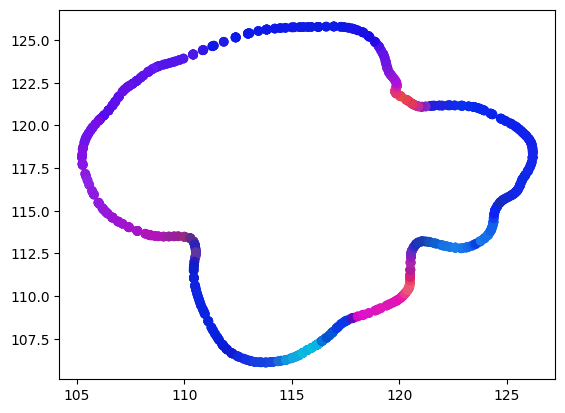

Layer 2.3


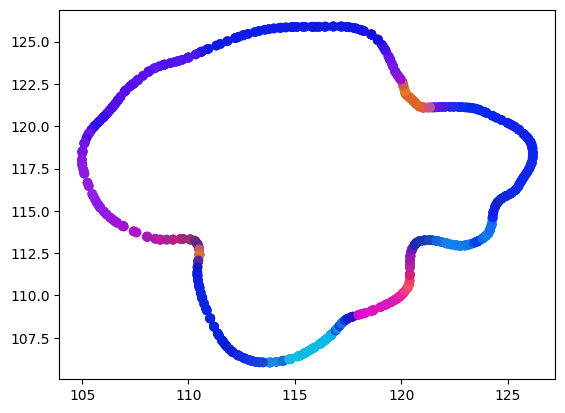

Layer 2.55


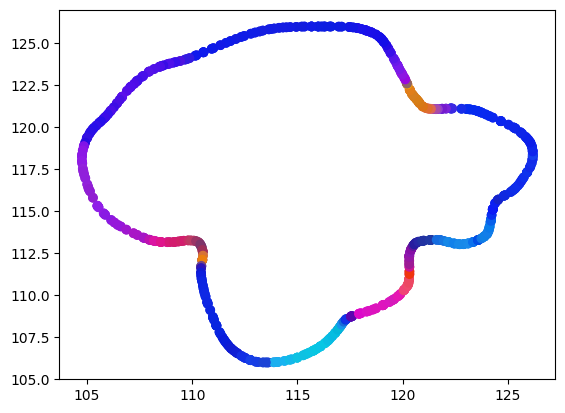

Layer 2.8


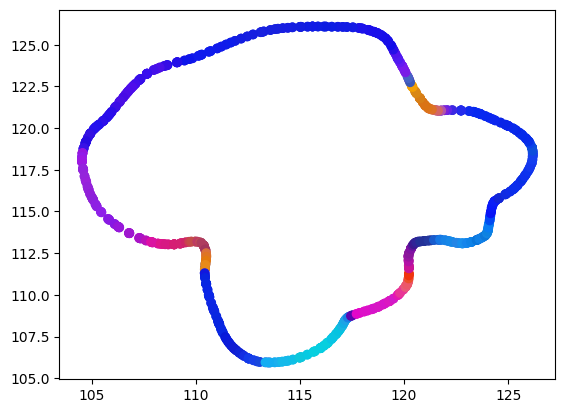

Layer 3.05


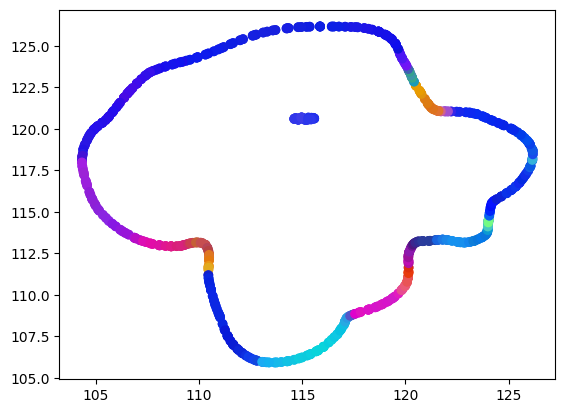

Layer 3.3


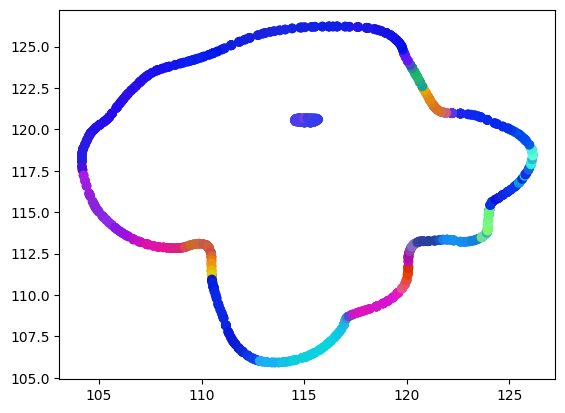

Layer 3.55


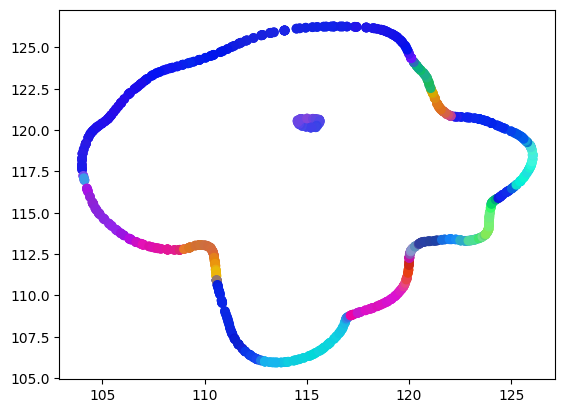

Layer 3.8


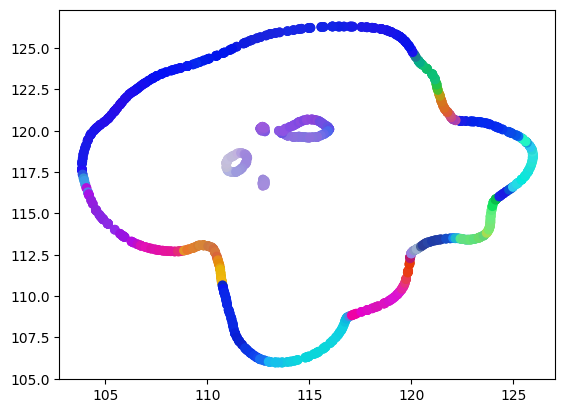

Layer 4.05


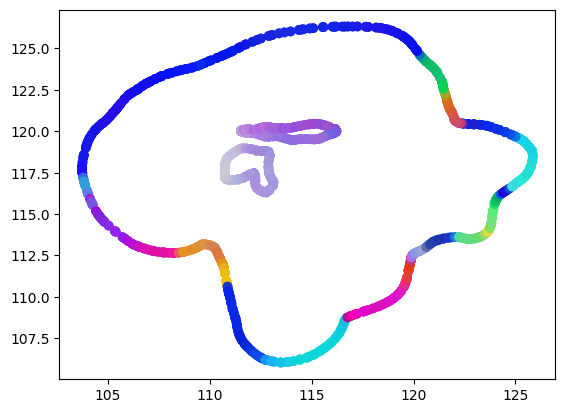

Layer 4.3


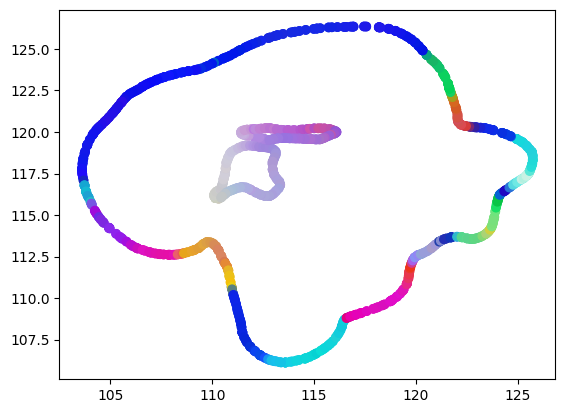

Layer 4.55


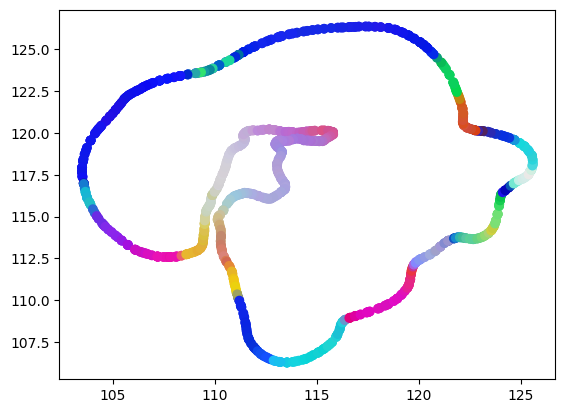

Layer 4.8


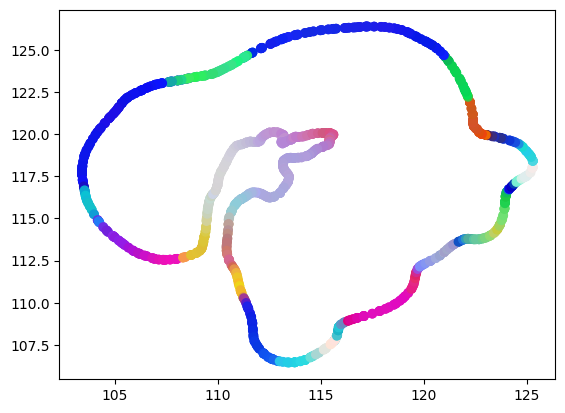

Layer 5.05


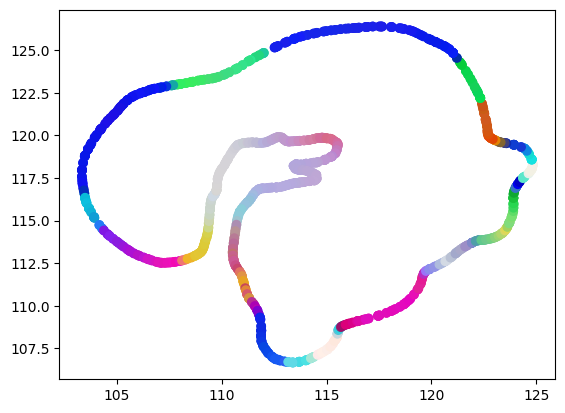

Layer 5.3


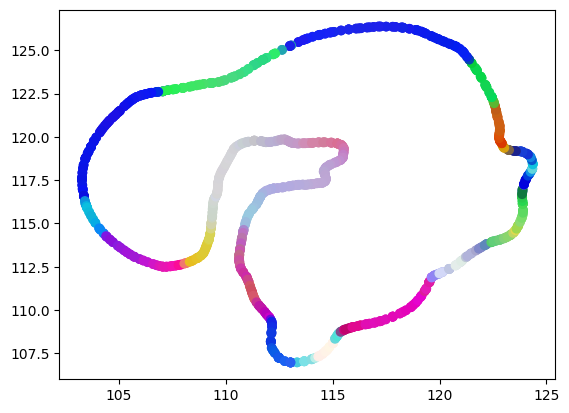

Layer 5.55


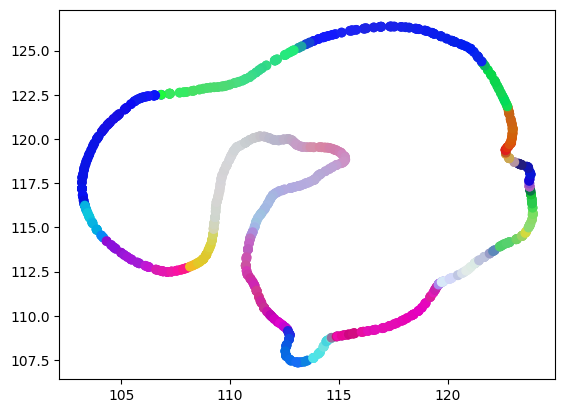

Layer 5.8


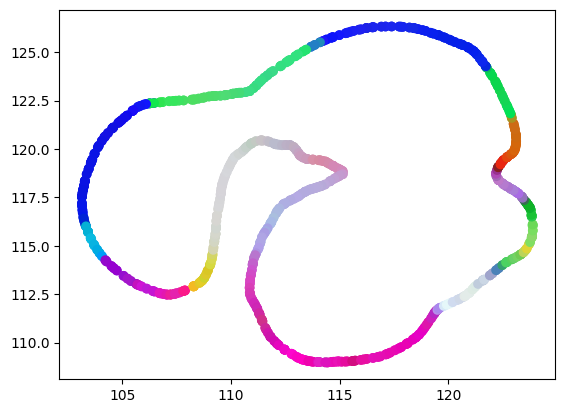

Layer 6.05


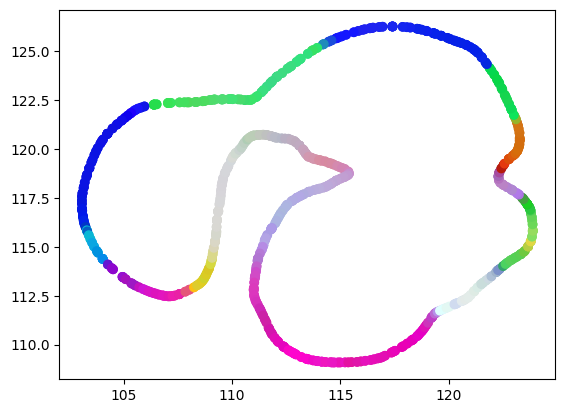

Layer 6.3


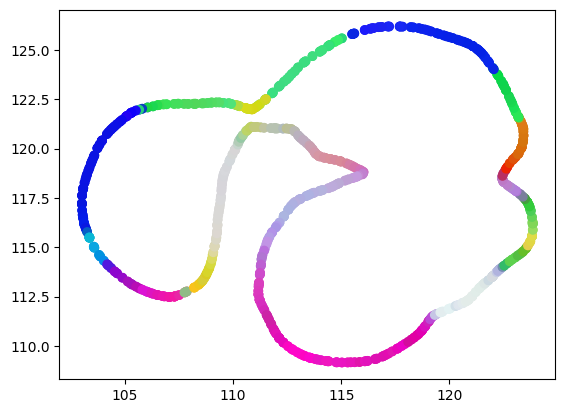

Layer 6.55


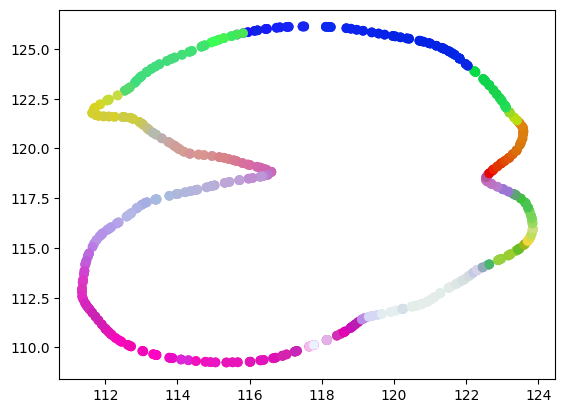

Layer 6.55


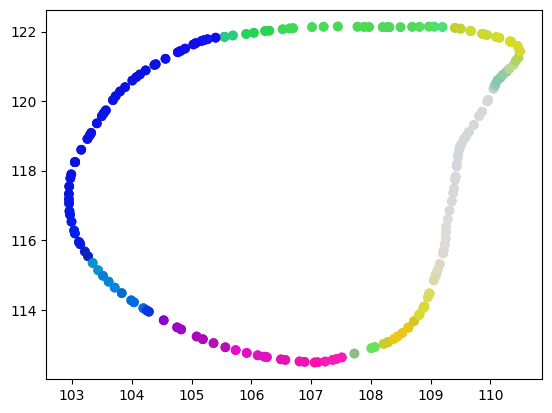

Layer 6.8


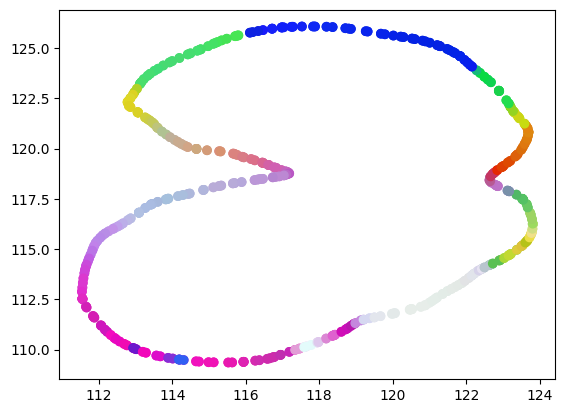

Layer 6.8


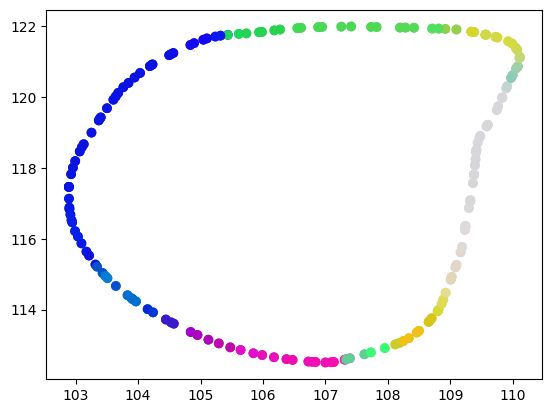

Layer 7.05


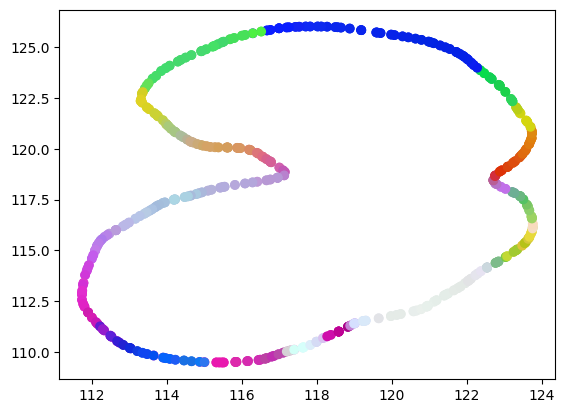

Layer 7.05


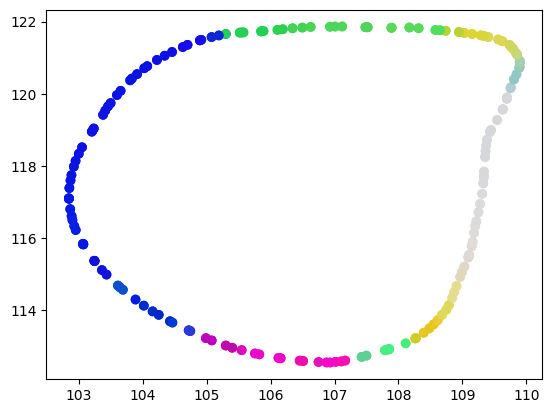

Layer 7.3


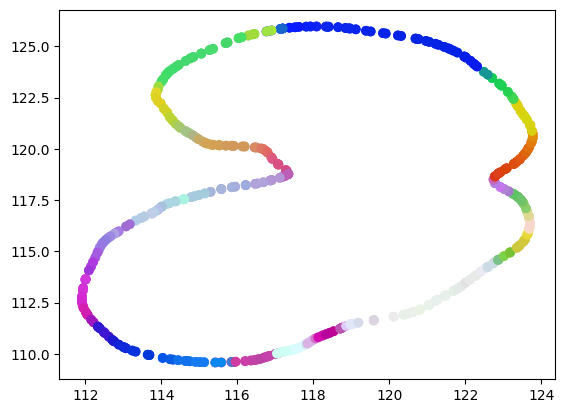

Layer 7.3


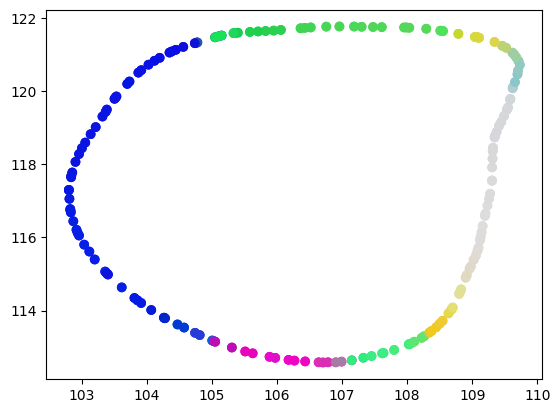

Layer 7.55


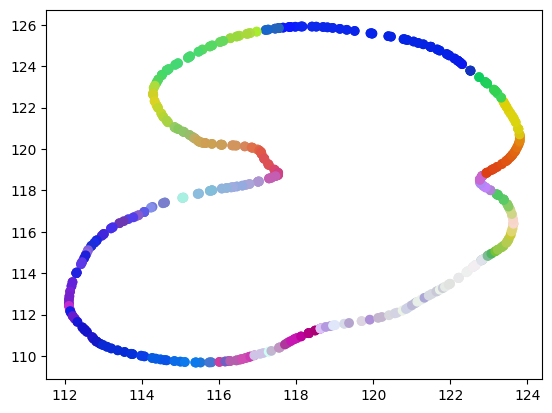

Layer 7.55


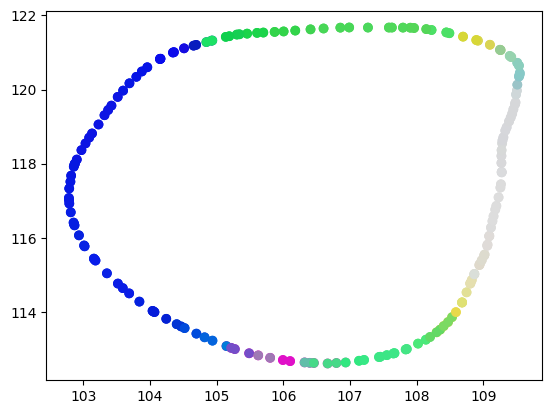

Layer 7.8


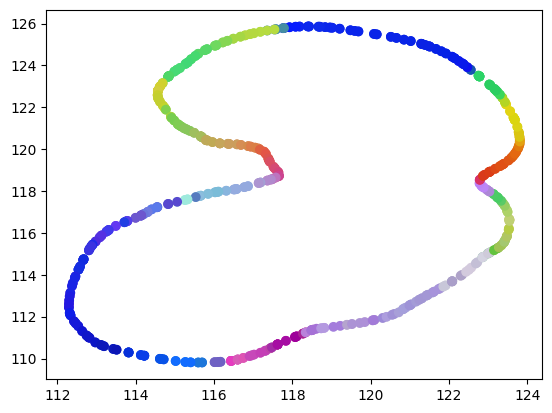

Layer 7.8


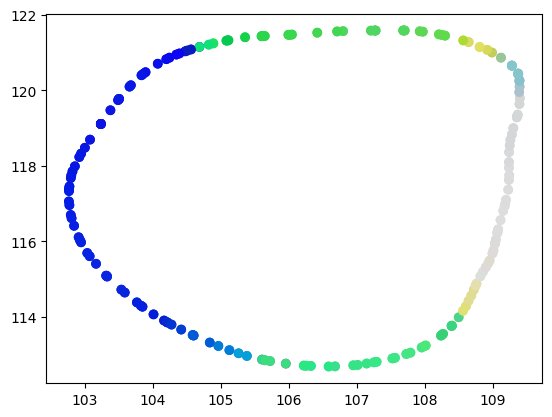

Layer 8.05


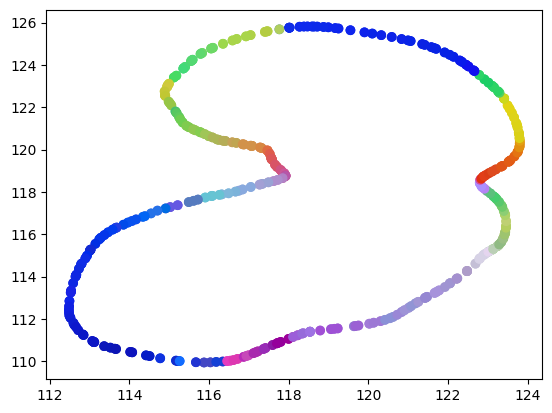

Layer 8.05


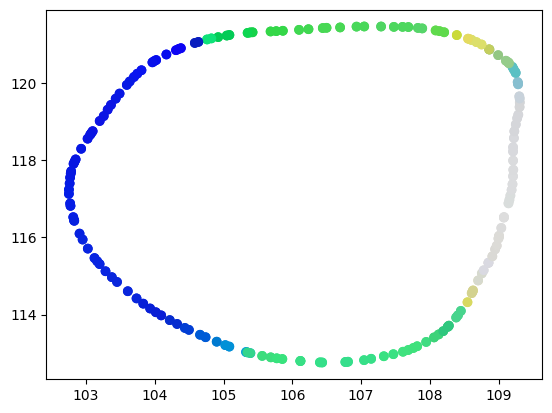

Layer 8.3


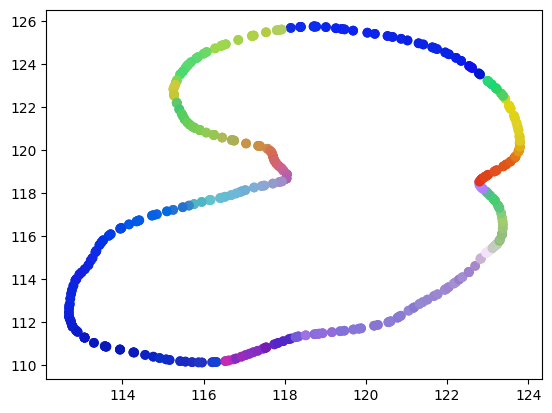

Layer 8.3


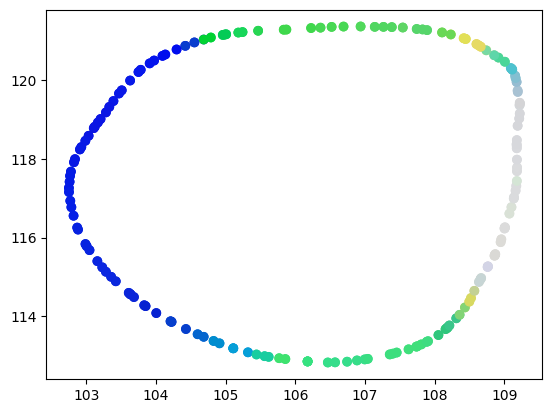

Layer 8.55


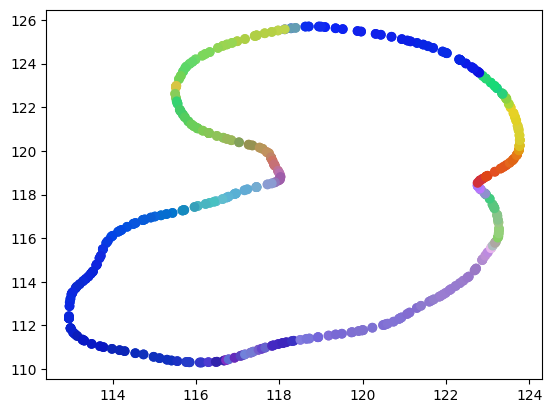

Layer 8.55


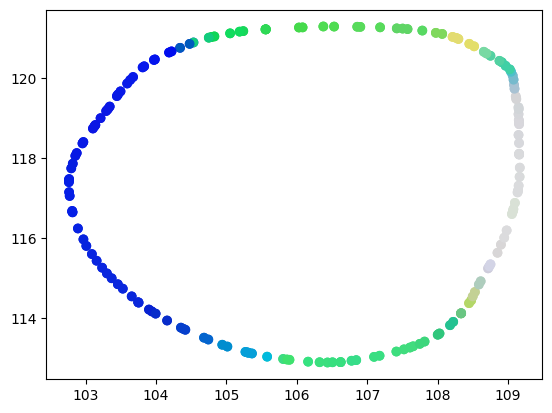

Layer 8.8


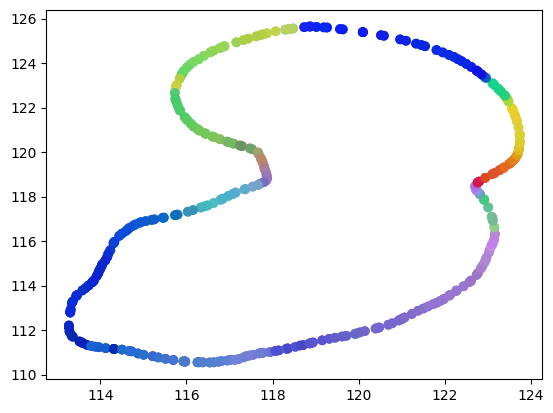

Layer 8.8


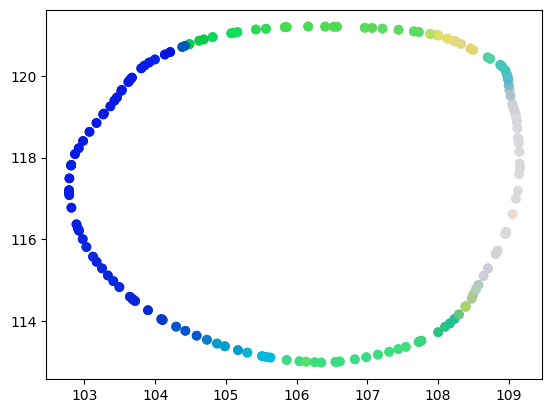

Layer 9.05


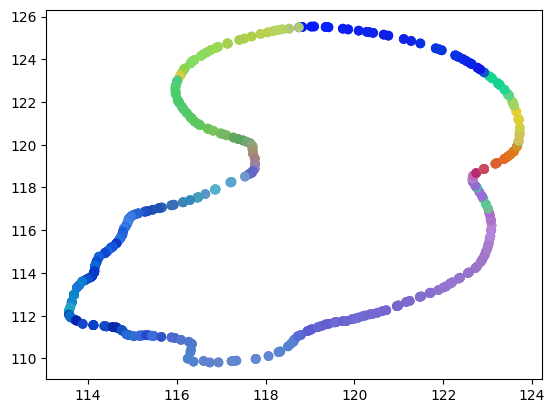

Layer 9.05


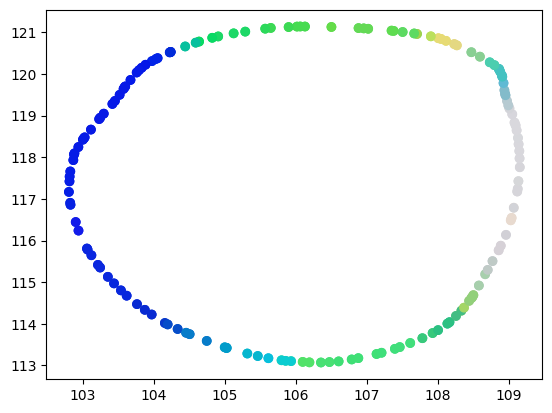

Layer 9.3


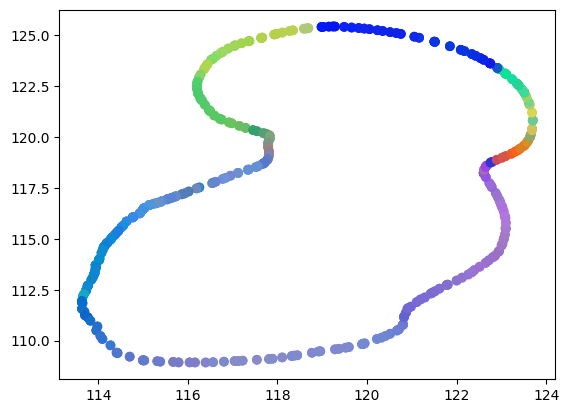

Layer 9.3


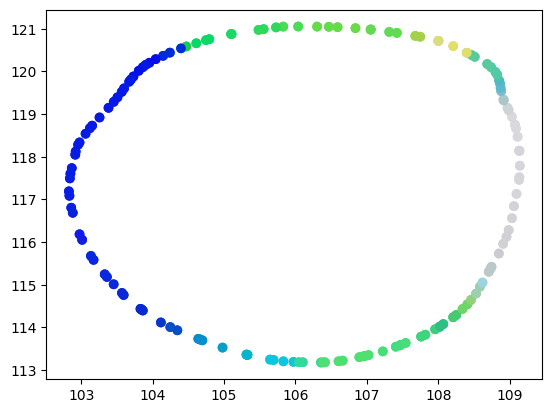

Layer 9.55


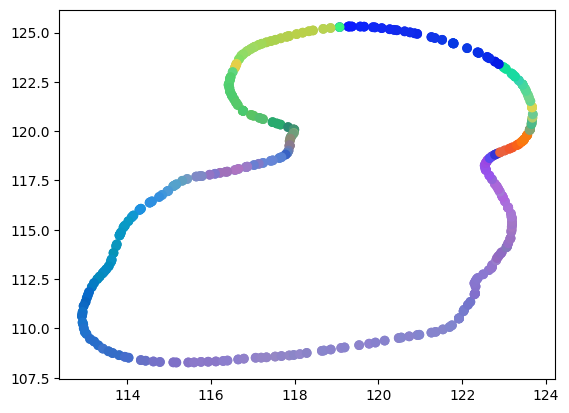

Layer 9.55


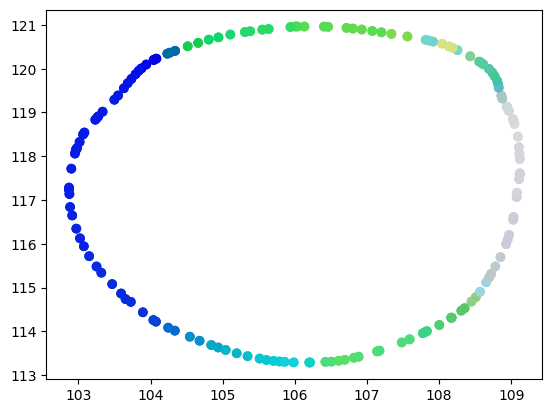

Layer 9.8


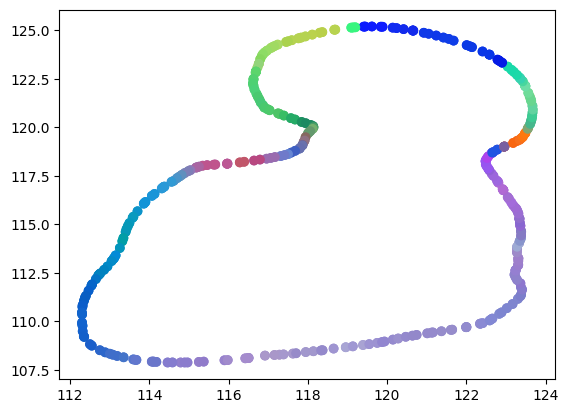

Layer 9.8


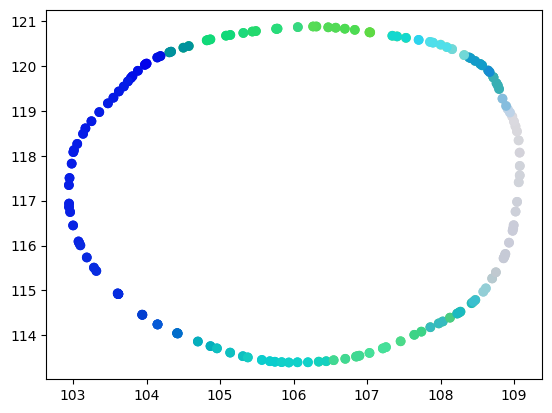

Layer 10.05


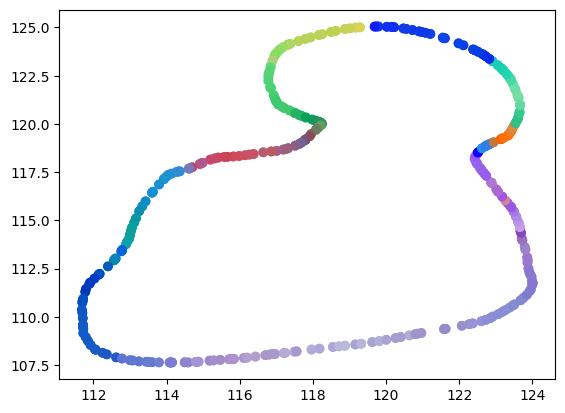

Layer 10.05


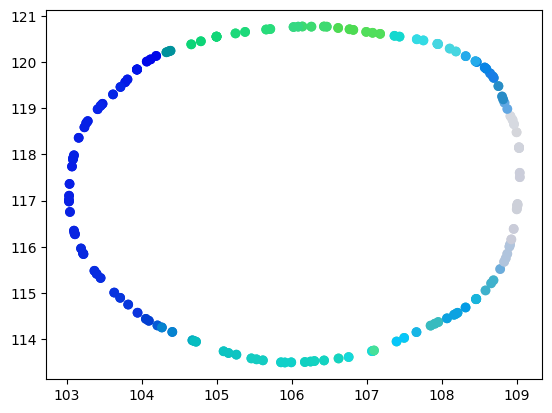

Layer 10.3


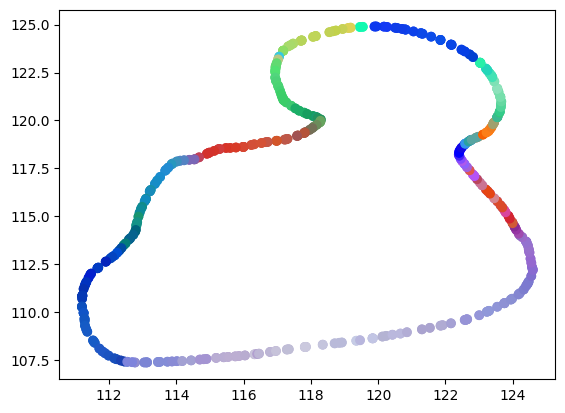

Layer 10.3


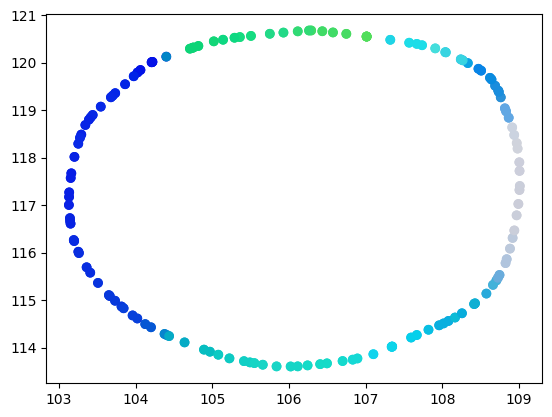

Layer 10.55


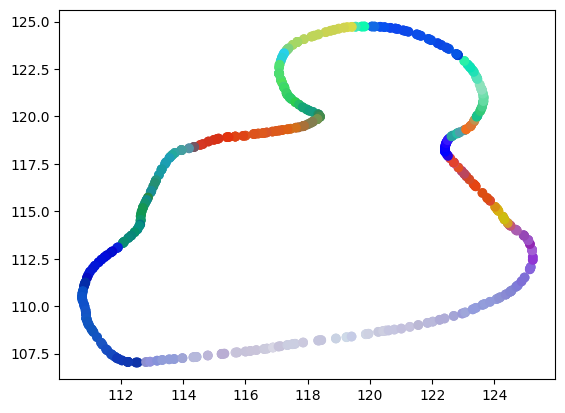

Layer 10.55


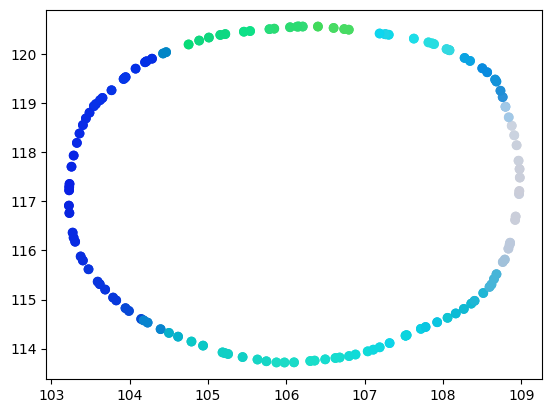

Layer 10.8


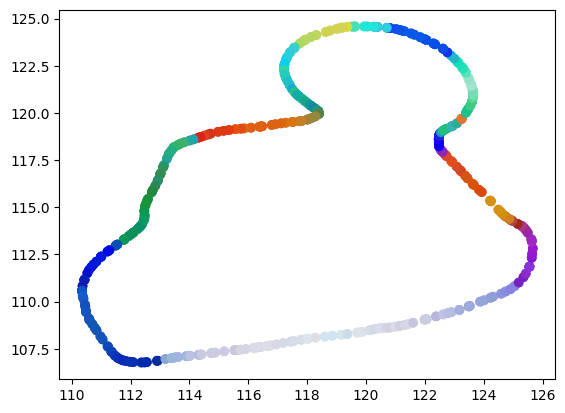

Layer 10.8


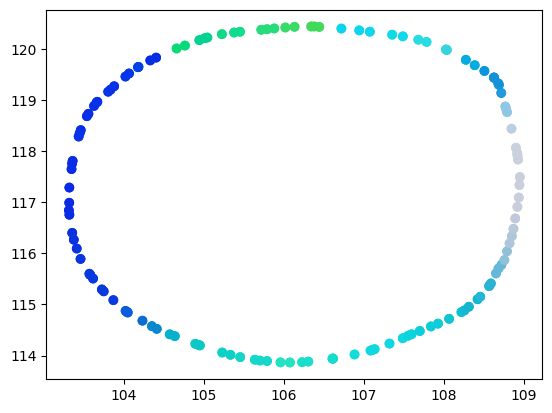

Layer 11.05


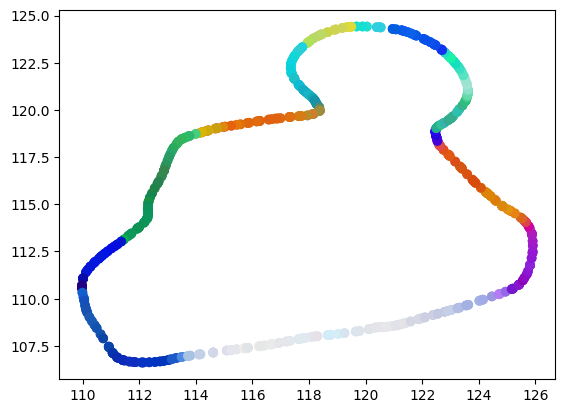

Layer 11.05


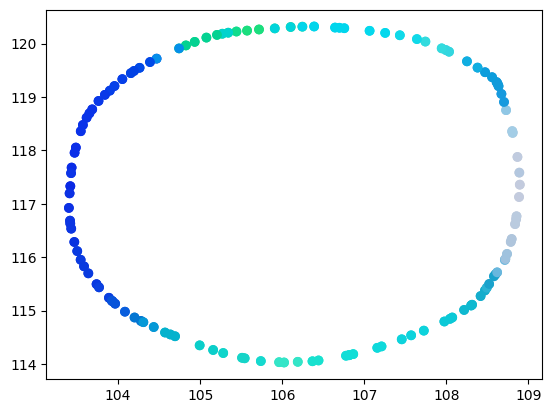

Layer 11.3


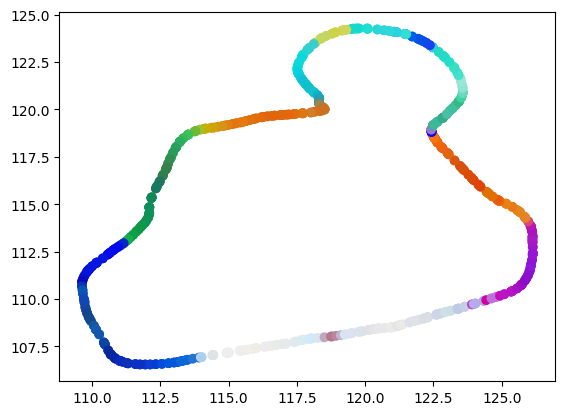

Layer 11.3


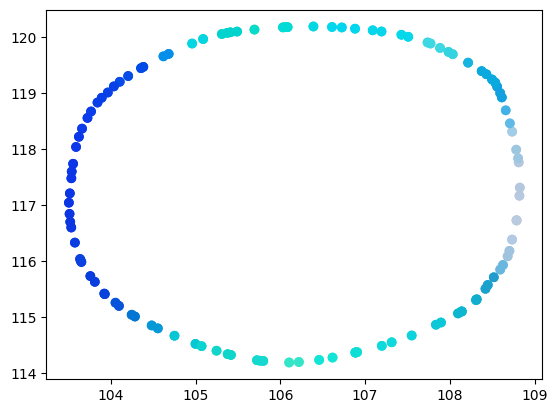

Layer 11.55


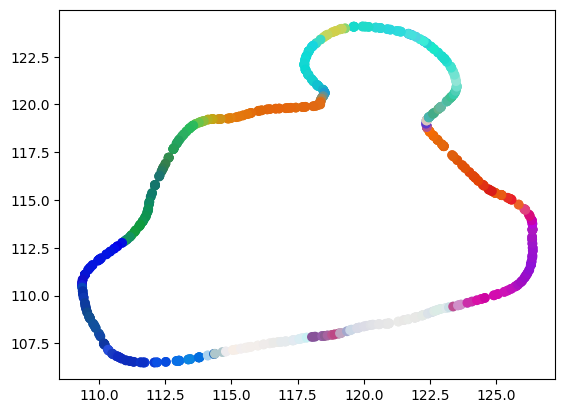

Layer 11.55


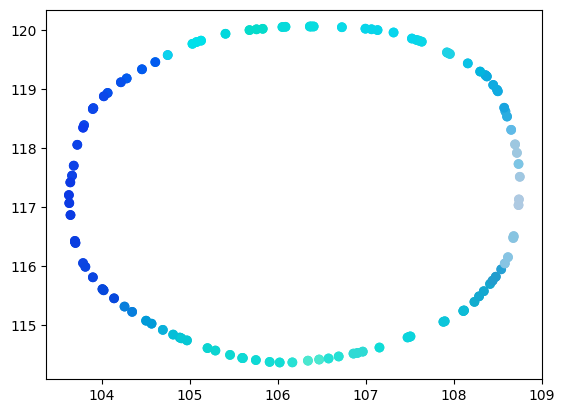

Layer 11.8


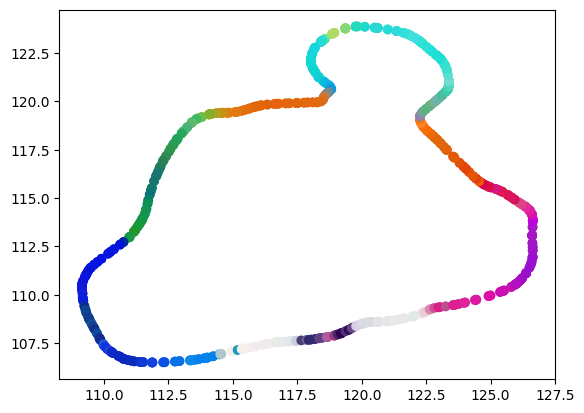

Layer 11.8


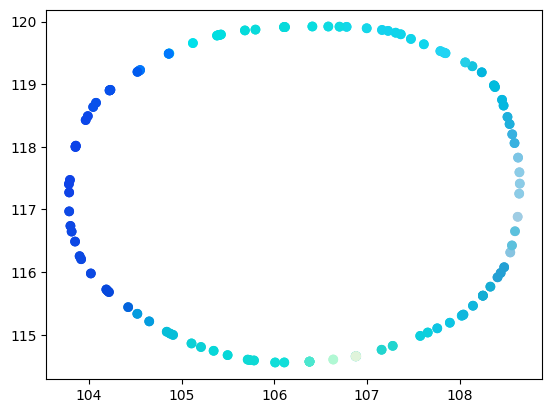

Layer 12.05


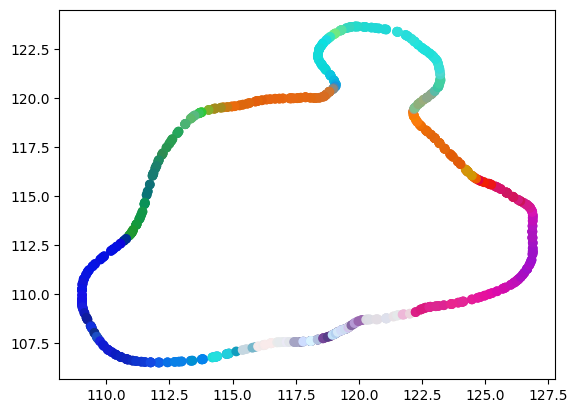

Layer 12.05


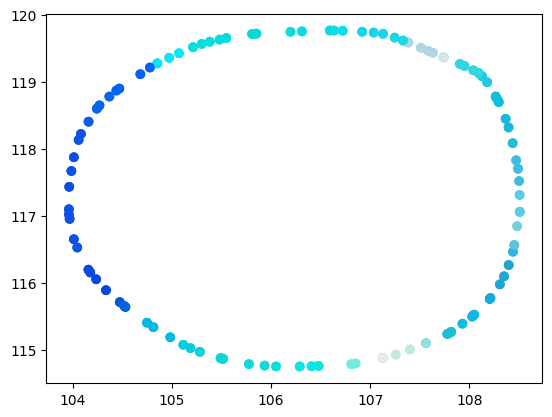

Layer 12.3


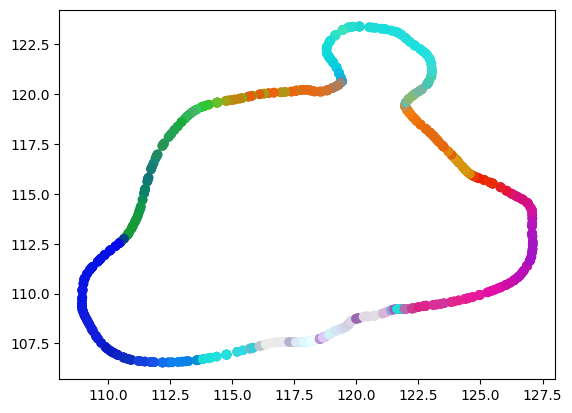

Layer 12.3


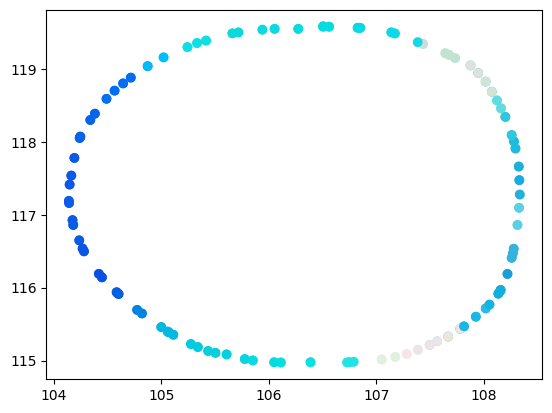

Layer 12.55


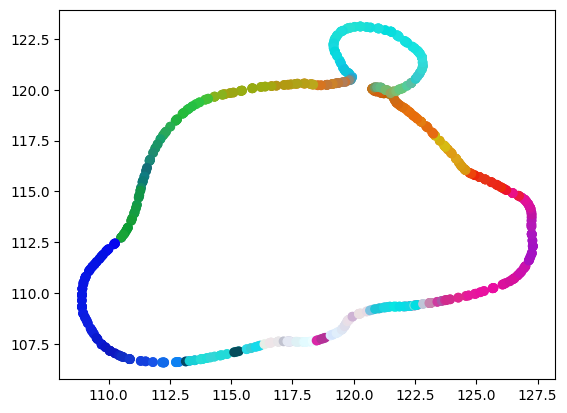

Layer 12.55


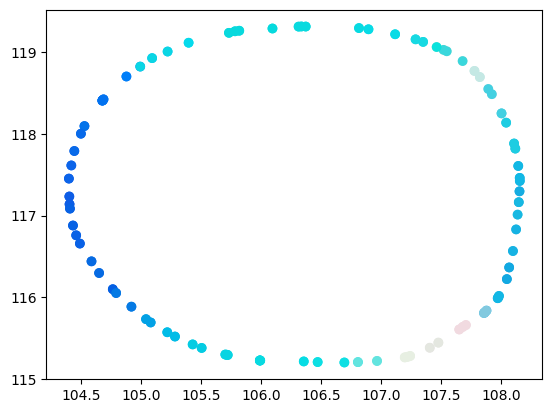

Layer 12.8


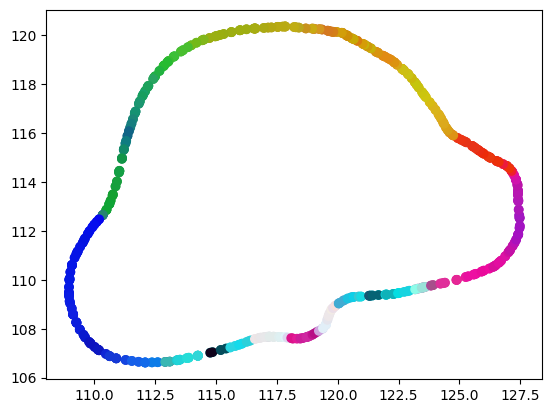

Layer 12.8


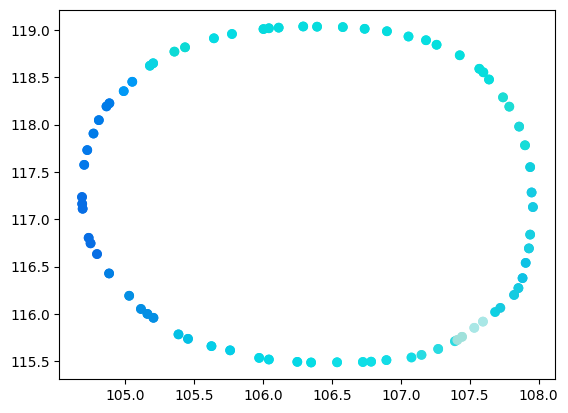

Layer 12.8


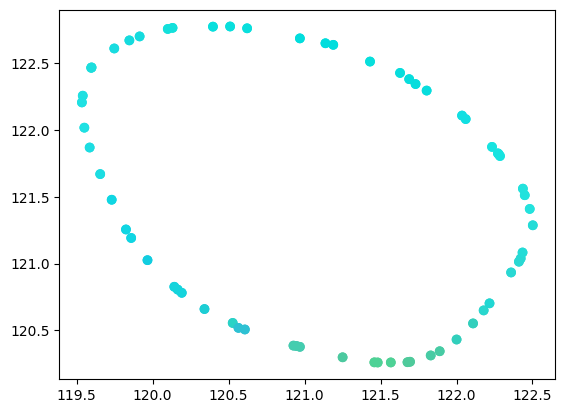

Layer 13.05


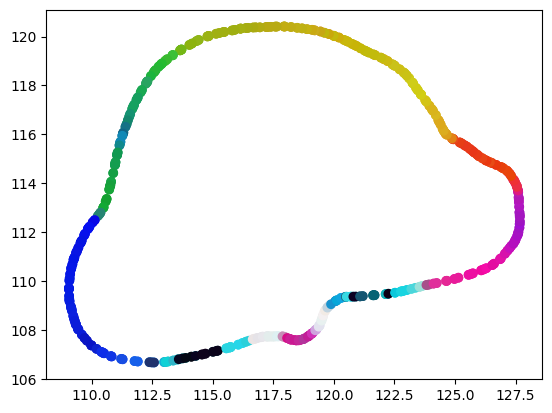

Layer 13.05


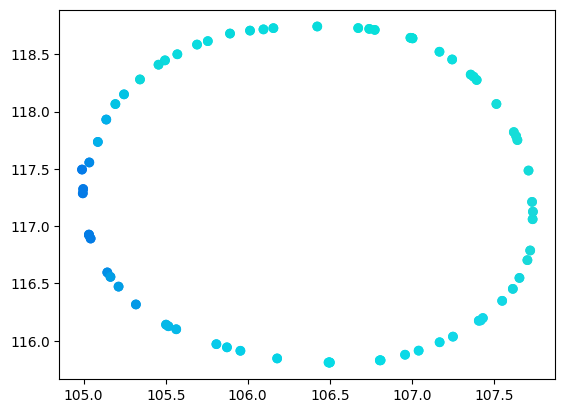

Layer 13.05


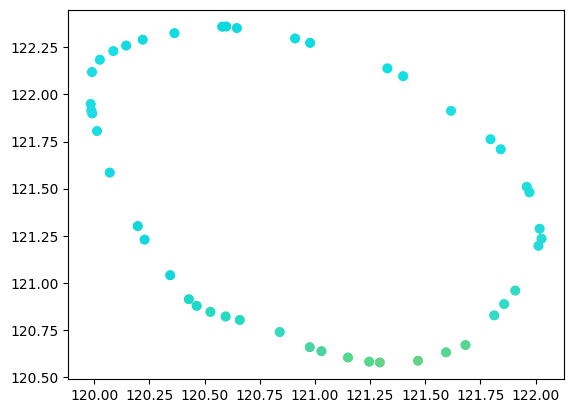

Layer 13.3


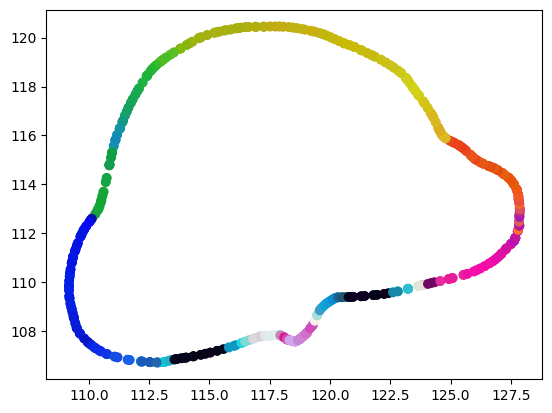

Layer 13.3


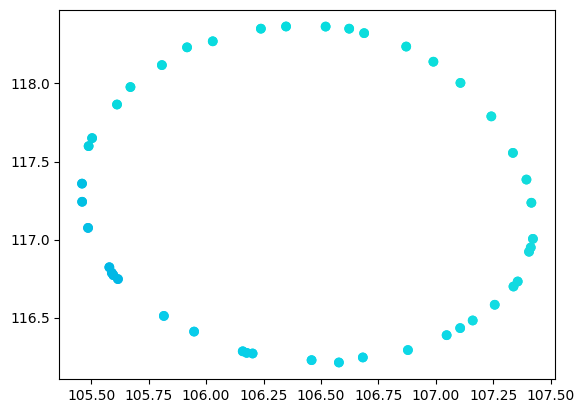

Layer 13.55


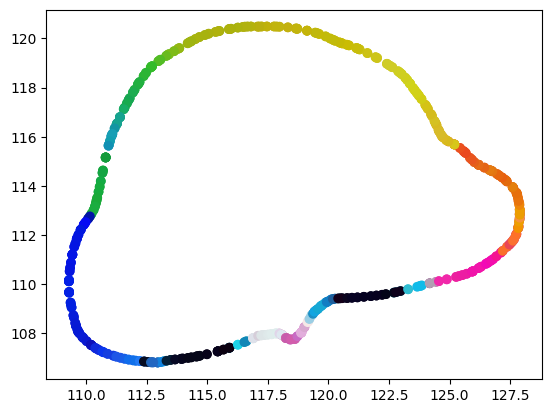

Layer 13.55


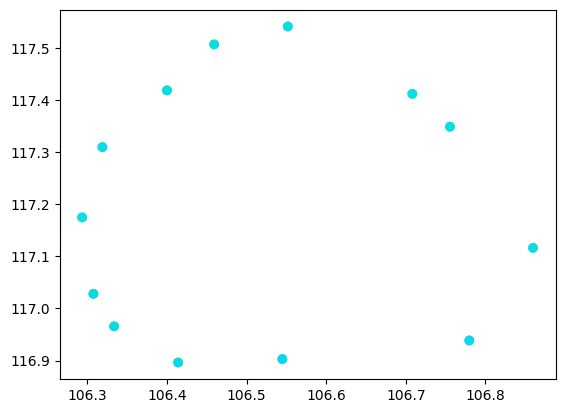

Layer 13.8


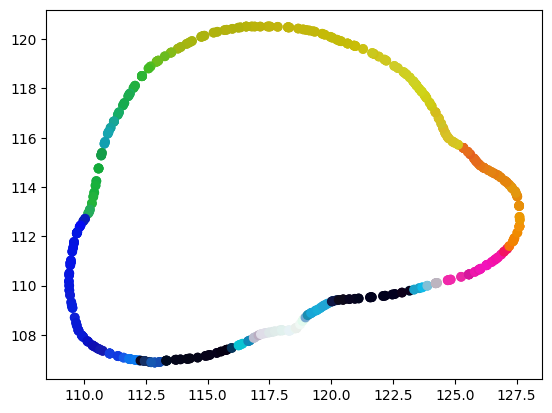

Layer 14.05


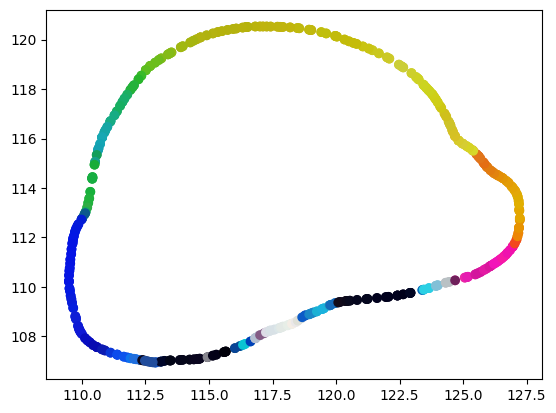

Layer 14.3


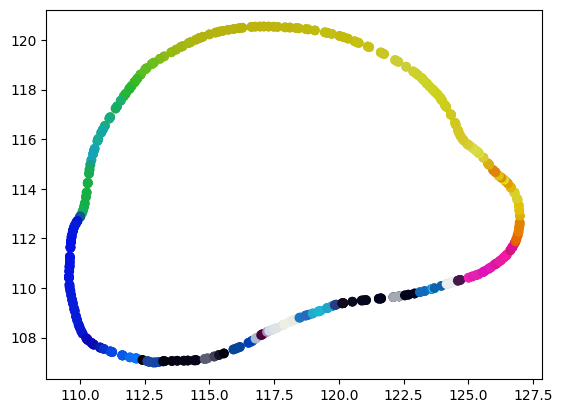

Layer 14.55


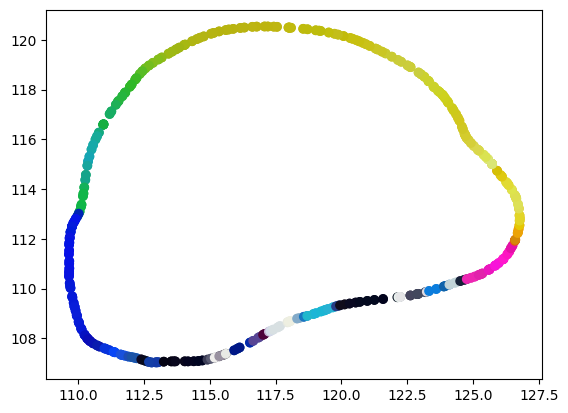

Layer 14.8


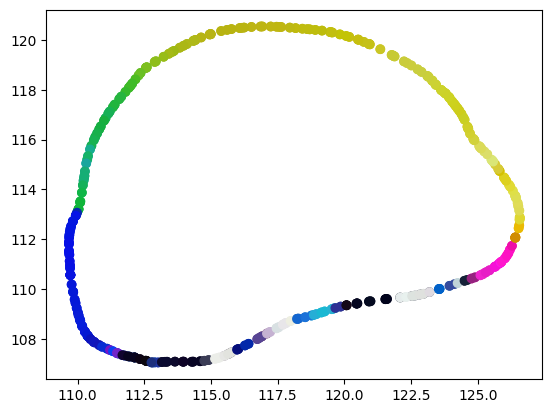

Layer 15.05


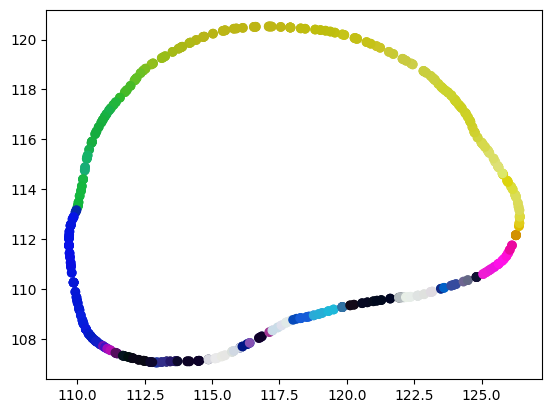

Layer 15.3


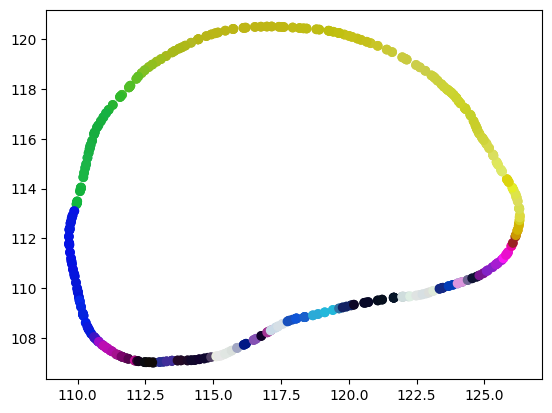

Layer 15.55


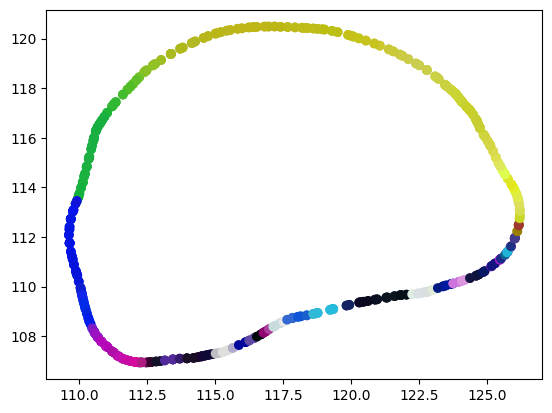

Layer 15.8


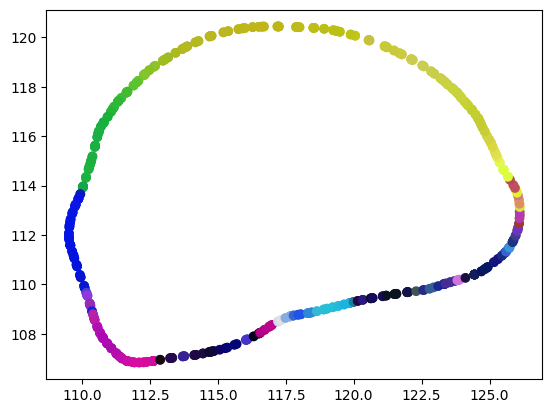

Layer 16.05


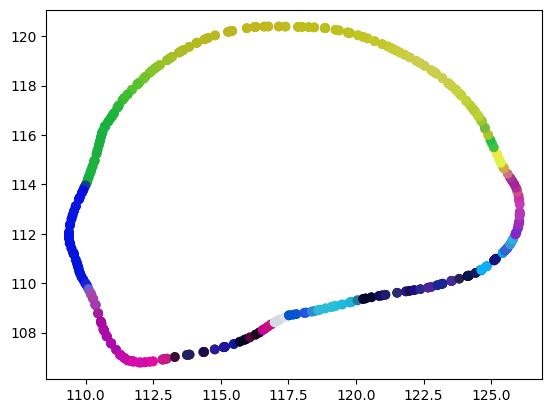

Layer 16.3


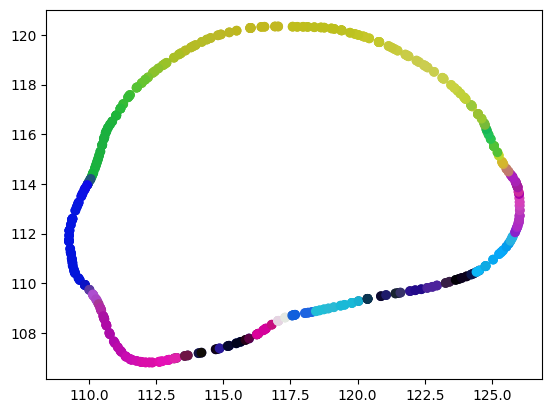

Layer 16.55


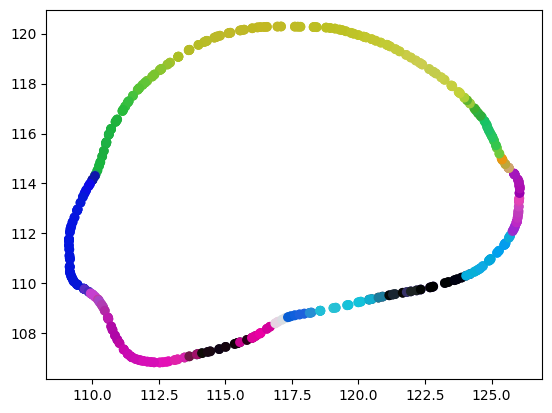

Layer 16.8


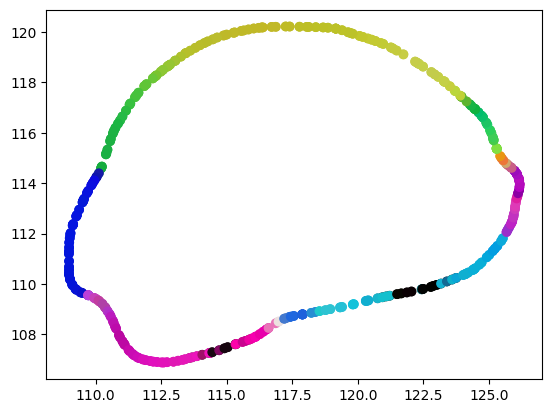

Layer 17.05


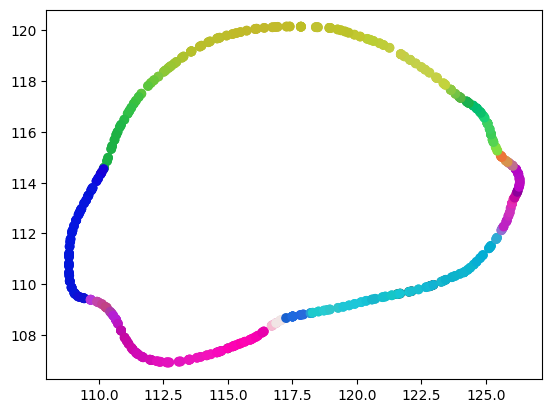

Layer 17.3


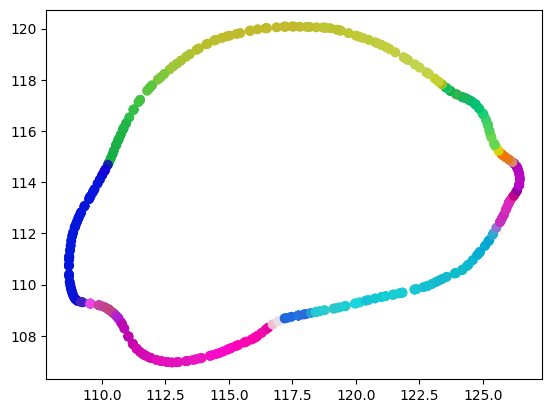

Layer 17.55


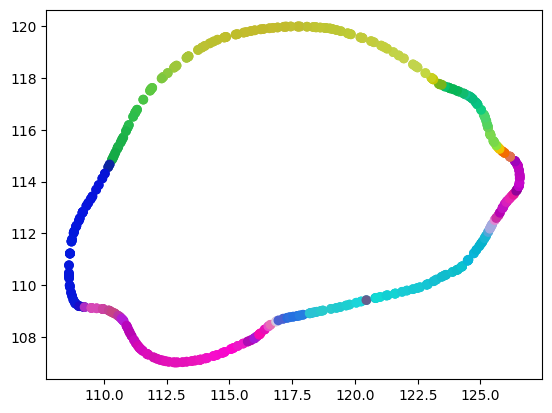

Layer 17.8


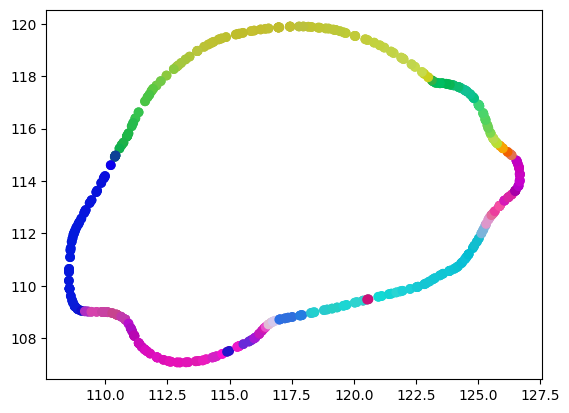

Layer 18.05


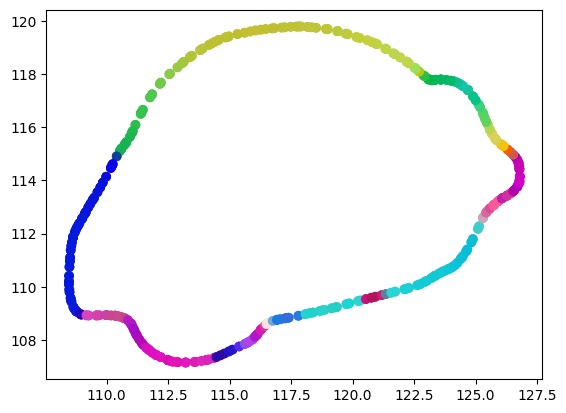

Layer 18.3


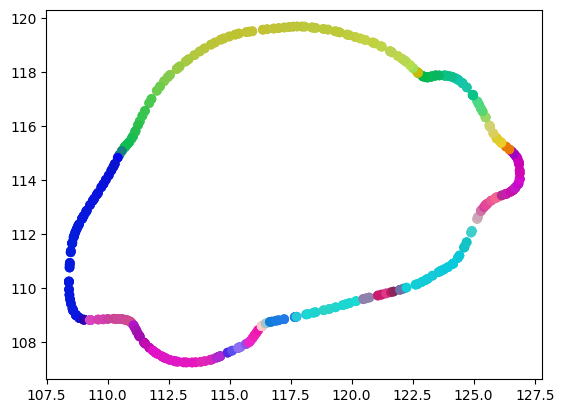

Layer 18.55


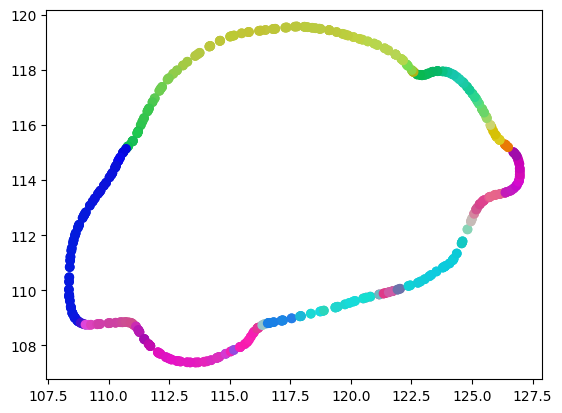

Layer 18.8


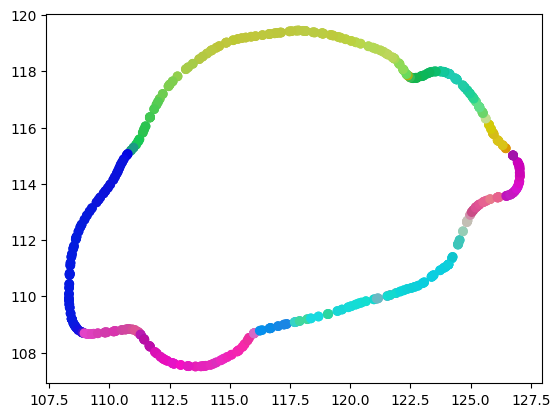

Layer 19.05


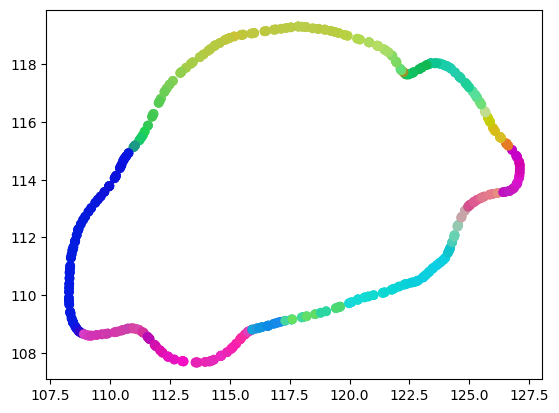

Layer 19.3


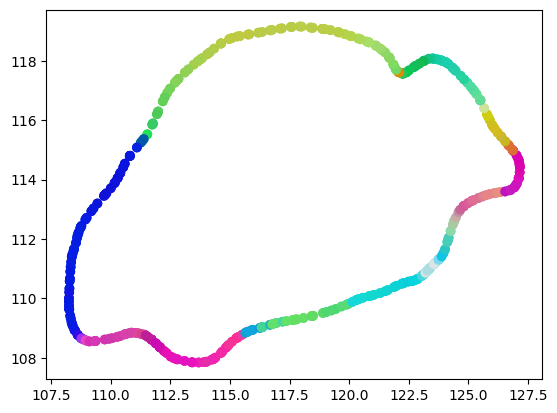

Layer 19.55


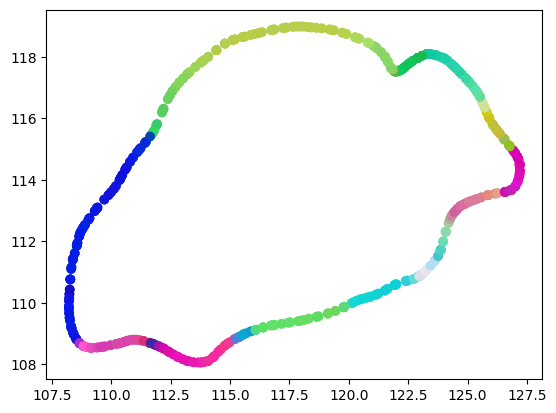

Layer 19.8


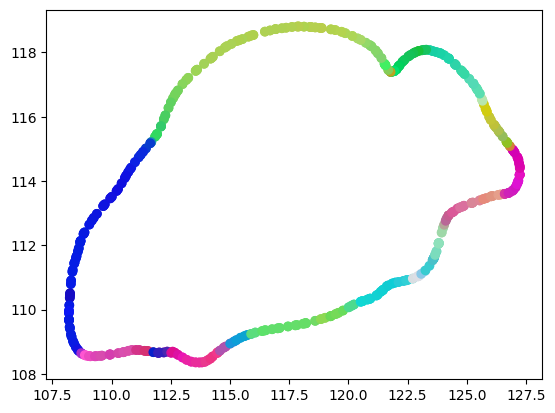

Layer 20.05


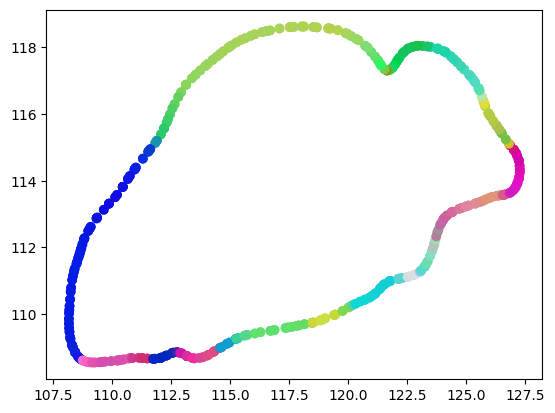

Layer 20.3


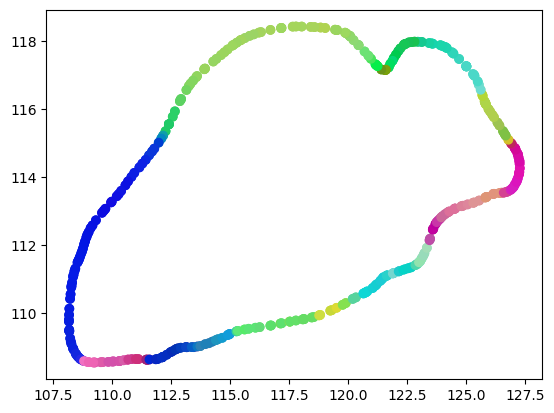

Layer 20.55


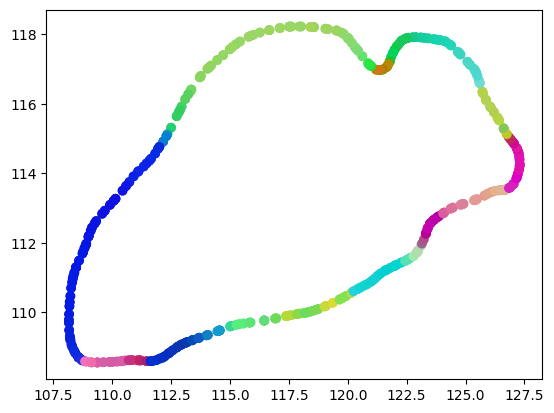

Layer 20.8


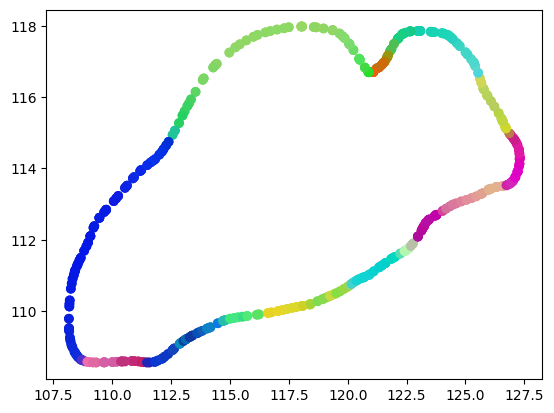

Layer 21.05


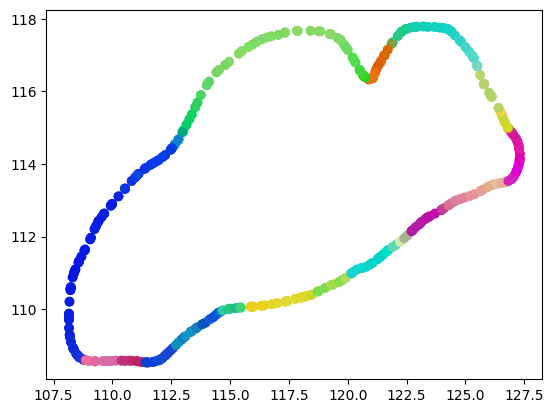

Layer 21.3


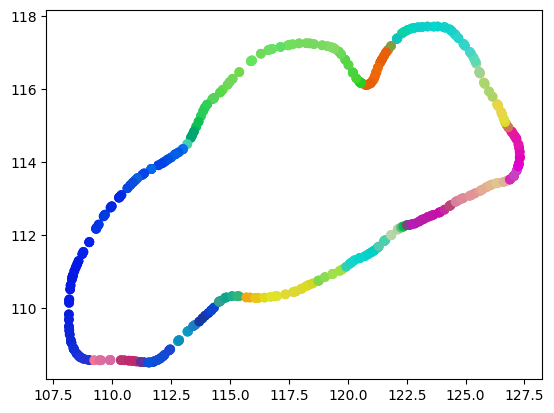

Layer 21.55


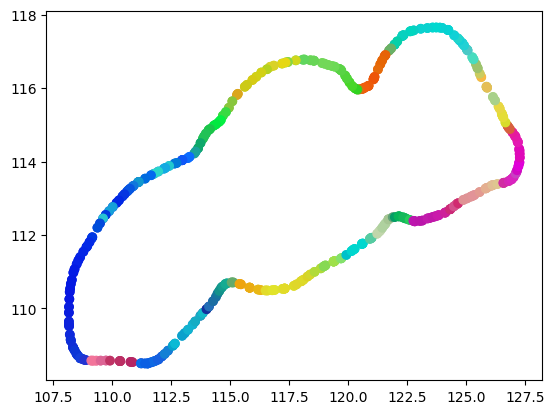

Layer 21.8


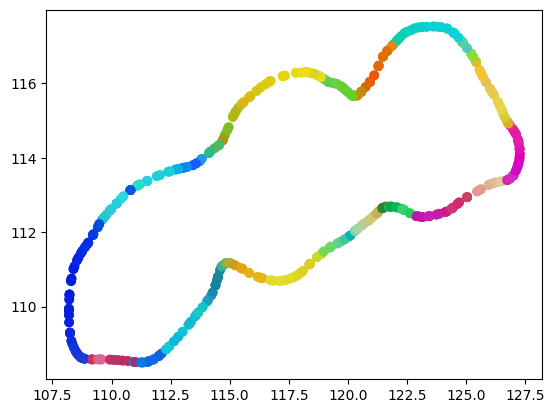

Layer 22.05


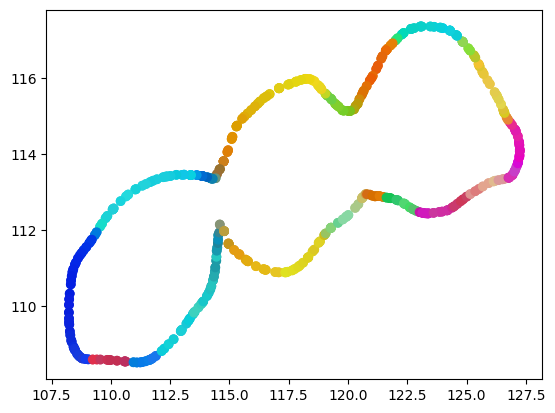

Layer 22.3


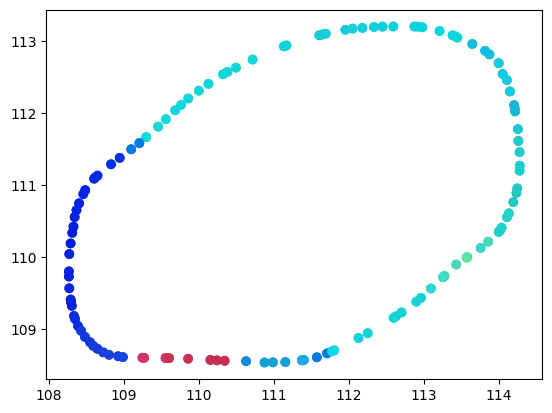

Layer 22.3


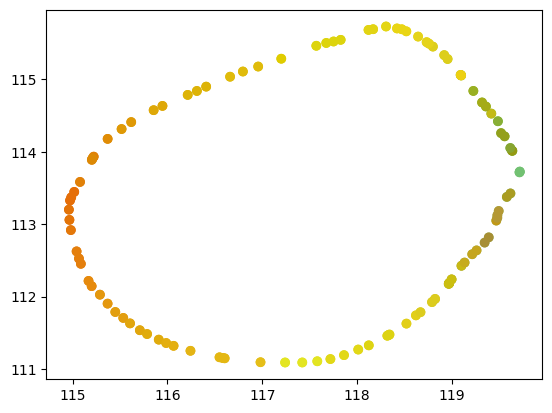

Layer 22.3


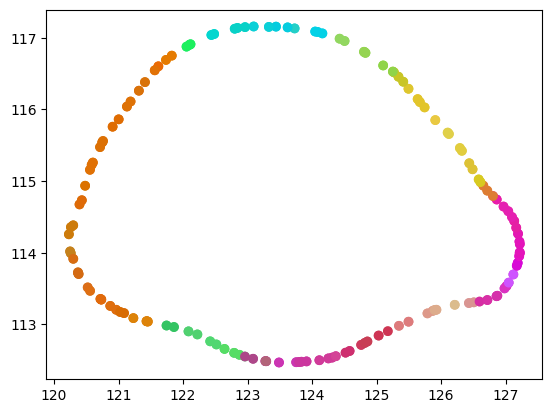

Layer 22.55


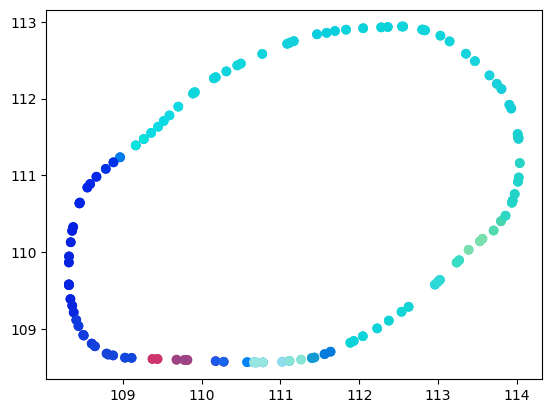

Layer 22.55


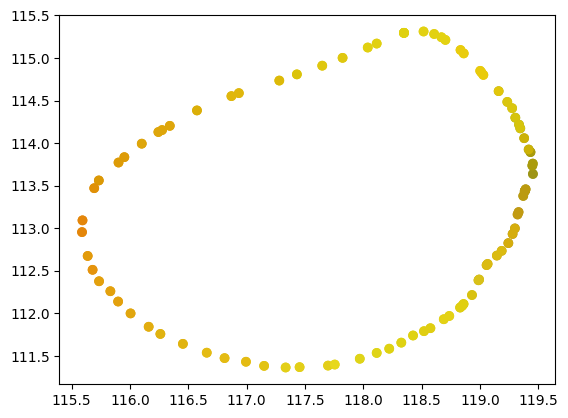

Layer 22.55


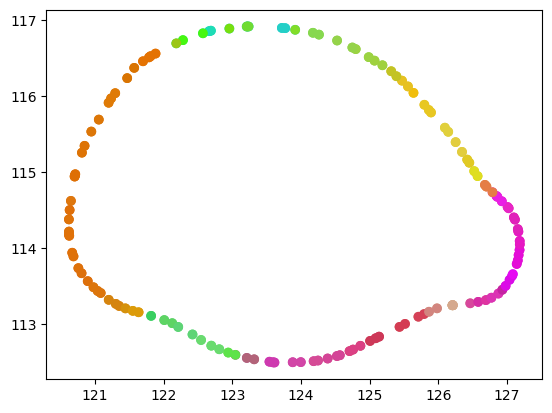

Layer 22.8


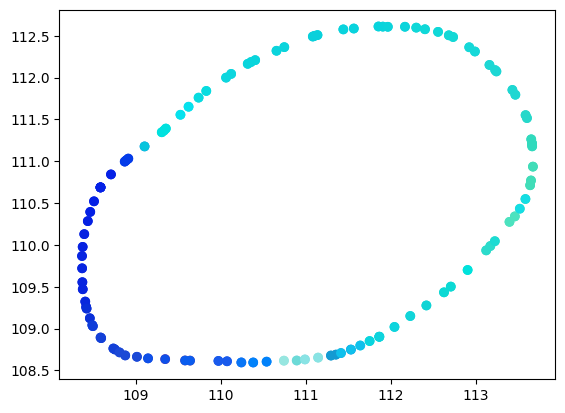

Layer 22.8


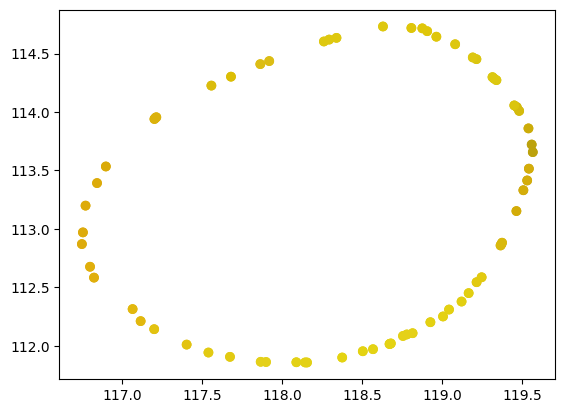

Layer 22.8


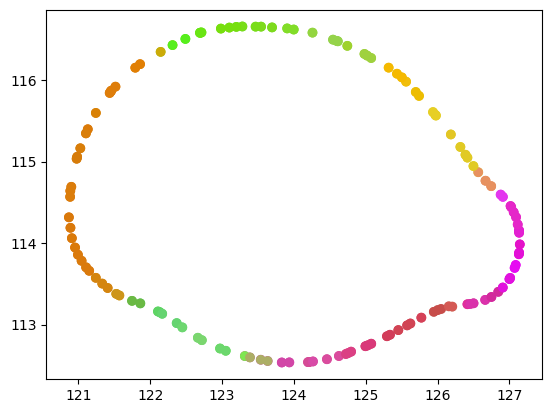

Layer 23.05


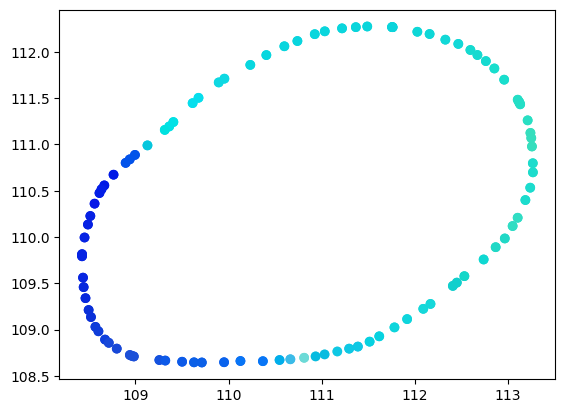

Layer 23.05


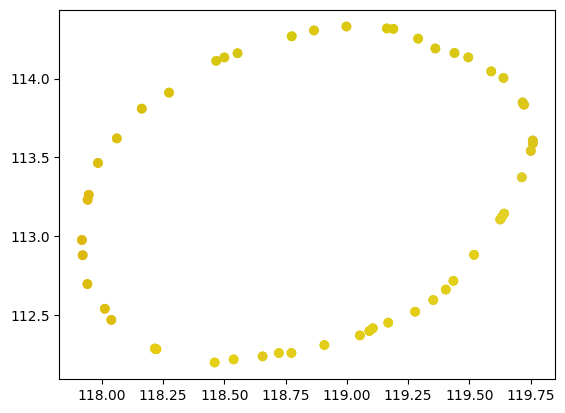

Layer 23.05


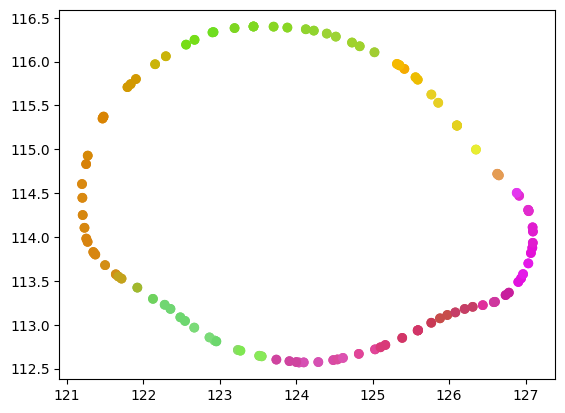

Layer 23.3


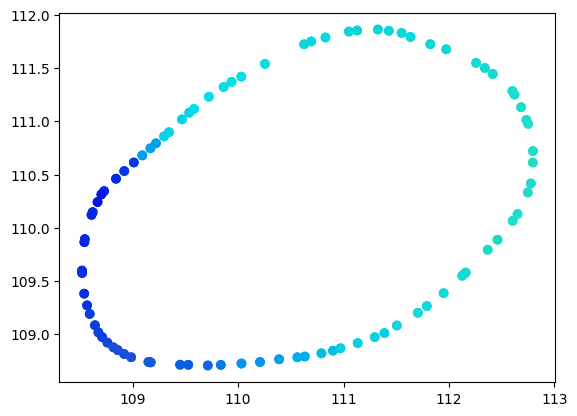

Layer 23.3


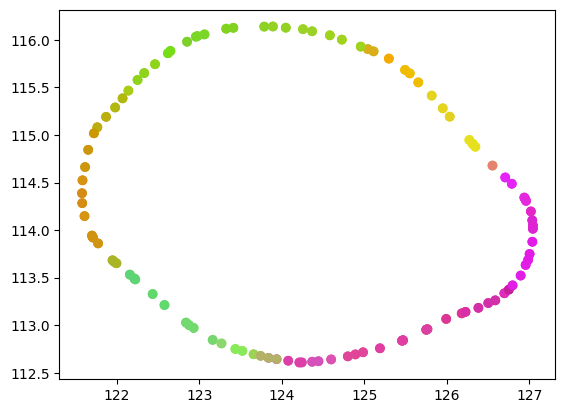

Layer 23.3


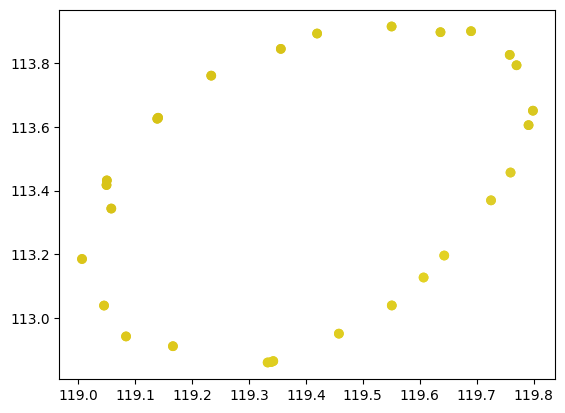

Layer 23.55


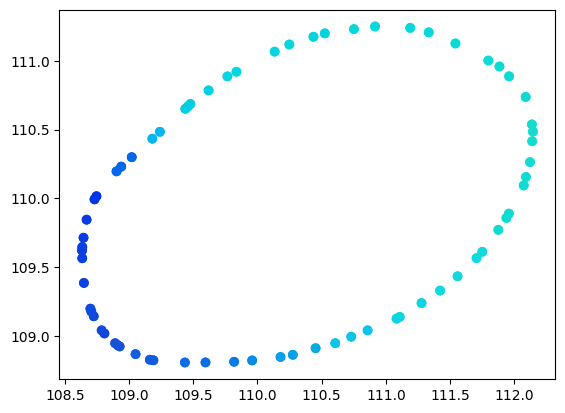

Layer 23.55


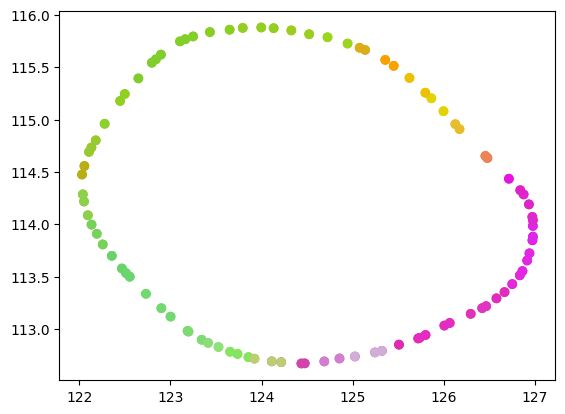

Layer 23.8


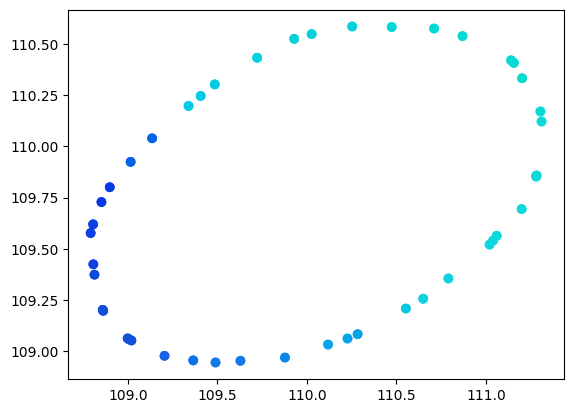

Layer 23.8


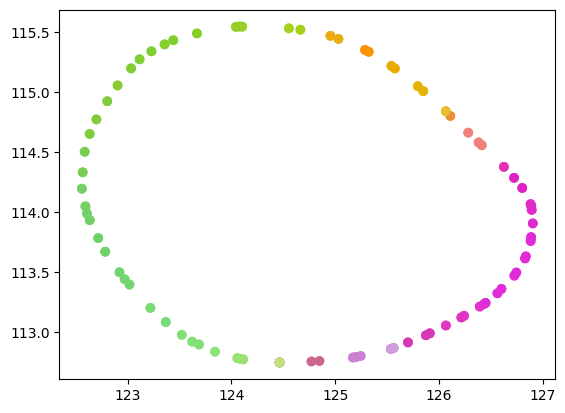

Layer 24.05


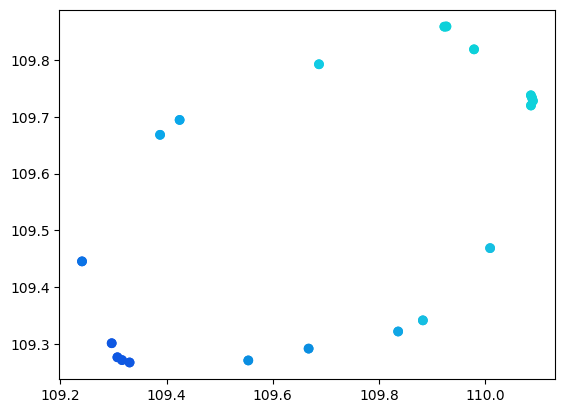

Layer 24.05


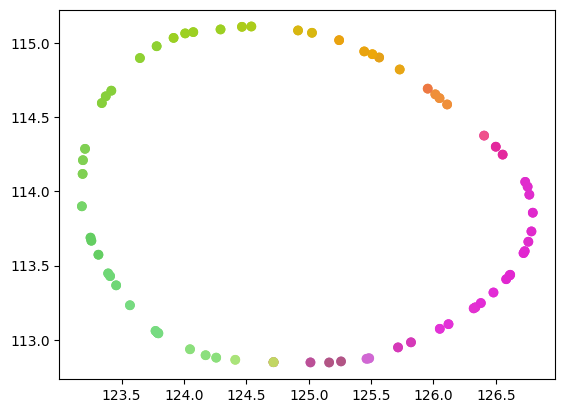

Layer 24.3


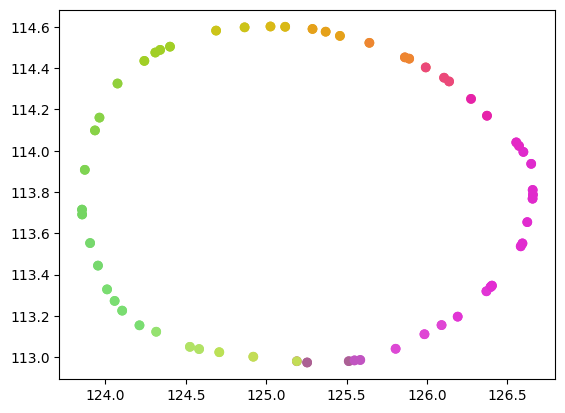

Layer 24.55


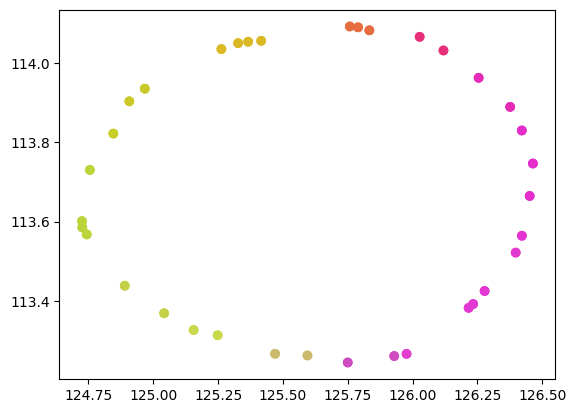

In [21]:
for e in layer_slices:
    x_coords=[]
    y_coords=[]
    color_map=[]
    for id in range(len(e.vertices)):
        v = e.vertices[id]
        x_coords.append(v[0]+sliced_transform[0])
        y_coords.append(v[1]+sliced_transform[1])
        color_map.append(plt_color(e.visual.vertex_colors[id]))
    print("Layer",e.bounds[0][2])
    plt.scatter(x_coords, y_coords, c=color_map)
    plt.show()